In [1]:
# Imports
import os
import requests
import pandas as pd
#import alpaca_trade_api as tradeapi
from MCForecastTools import MCSimulation
import panel as pn
pn.extension('plotly')
import plotly.express as px
import hvplot.pandas
import matplotlib.pyplot as plt
from pathlib import Path
from dotenv import load_dotenv
import yfinance as yf
import numpy as np
from itertools import product

%matplotlib inline

C:\Users\jorda\anaconda3\envs\pyvizenv\lib\site-packages\xarray\core\merge.py:10: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  PANDAS_TYPES = (pd.Series, pd.DataFrame, pd.Panel)



Bad key "text.kerning_factor" on line 4 in
C:\Users\jorda\anaconda3\envs\pyvizenv\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


In [2]:
# Load .env enviroment variables
load_dotenv()

True

In [3]:
# Stock Protfolio Info & Table
stocks = ['2357.TW', 'AAPL', 'AC.TO', 'CCL', 'CM-PQ.TO', 'F', 'MSFT', 'NVDA', 'PFE', 'TSLA']

stockportfolio = {
    'Asset' : stocks,
    'Amount' : [100, 1000, 1000, 1000, 1000, 100, 100, 1000, 100, 100],
    'Cost' : [367, 25.91, 28.13, 23.76, 15.19, 265.02, 761.24, 38.98, 349.46, 671.87]
}

#Creating a dataframe using the dictionary
stockportfoliotable = pd.DataFrame.from_dict(stockportfolio, orient='index')
stockportfoliotable = stockportfoliotable.transpose()
stockportfoliotable = stockportfoliotable.set_index('Asset')
stockportfoliotable['Cost Basis'] = stockportfoliotable.Amount * stockportfoliotable.Cost
stocktotalcostbasis = stockportfoliotable['Cost Basis'].sum()
stockportfoliotable['Position %'] = stockportfoliotable['Cost Basis'] / stocktotalcostbasis

#Create Stock Weight List for MC Simulation
stockweight = stockportfoliotable['Position %'].to_list()

stockportfoliotable

,Amount,Cost,Cost Basis,Position %
Asset,,,,
2357.TW,100,367,36700,0.0982784
AAPL,1000,25.91,25910,0.069384
AC.TO,1000,28.13,28130,0.0753289
CCL,1000,23.76,23760,0.0636266
CM-PQ.TO,1000,15.19,15190,0.0406771
F,100,265.02,26502,0.0709693
MSFT,100,761.24,76124,0.203851
NVDA,1000,38.98,38980,0.104384
PFE,100,349.46,34946,0.0935814


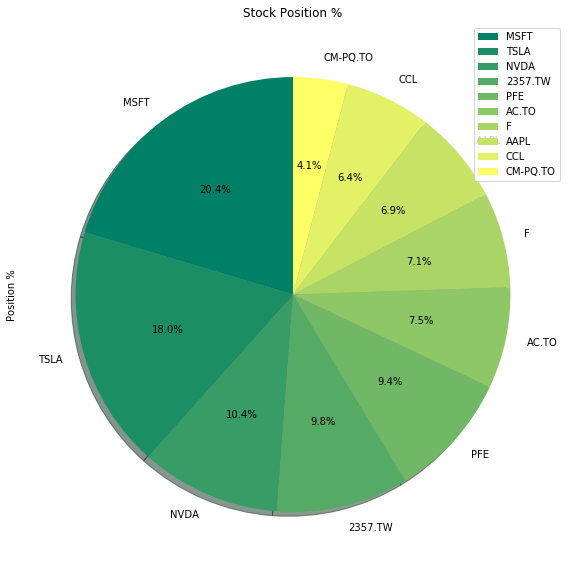

In [4]:
# Create a Pie Chart of the Portfolio Data
stockportsorted = stockportfoliotable.sort_values(['Position %'], ascending=False)

stockportsorted = stockportsorted.plot(kind='pie', y='Position %', shadow = True, startangle=90,
                                figsize=(15,10), autopct='%1.1f%%', title='Stock Position %', colormap='summer')

In [5]:
#Getting Sector info for Pie Chart
#sectors = []
#for i in stocks:
    #tickers = yf.Tickers(i)
    #sectors.append((tickers.tickers[i]).info[sector])
#sectors

In [6]:
# Stock Protfolio Info & Table
crypto = ['ADA-USD', 'BTC-USD', 'ETH-USD', 'LINK-USD', 'LTC-USD']

cryptoportfolio = {
    'Asset' : crypto,
    'Amount' : [10000, 1, 10, 1000, 100],
    'Cost' : [1.2902, 32870.84, 1865.51, 17.25, 128.45]
}

#Creating a dataframe using the dictionary
cryptoportfoliotable = pd.DataFrame.from_dict(cryptoportfolio, orient='index')
cryptoportfoliotable = cryptoportfoliotable.transpose()
cryptoportfoliotable = cryptoportfoliotable.set_index('Asset')
cryptoportfoliotable['Cost Basis'] = cryptoportfoliotable.Amount * cryptoportfoliotable.Cost
cryptototalcostbasis = cryptoportfoliotable['Cost Basis'].sum()
cryptoportfoliotable['Position %'] = cryptoportfoliotable['Cost Basis'] / cryptototalcostbasis

cryptoweight = cryptoportfoliotable['Position %'].to_list()
cryptoportfoliotable

,Amount,Cost,Cost Basis,Position %
Asset,,,,
ADA-USD,10000,1.2902,12902,0.136496
BTC-USD,1,32870.8,32870.8,0.347755
ETH-USD,10,1865.51,18655.1,0.197361
LINK-USD,1000,17.25,17250,0.182495
LTC-USD,100,128.45,12845,0.135893


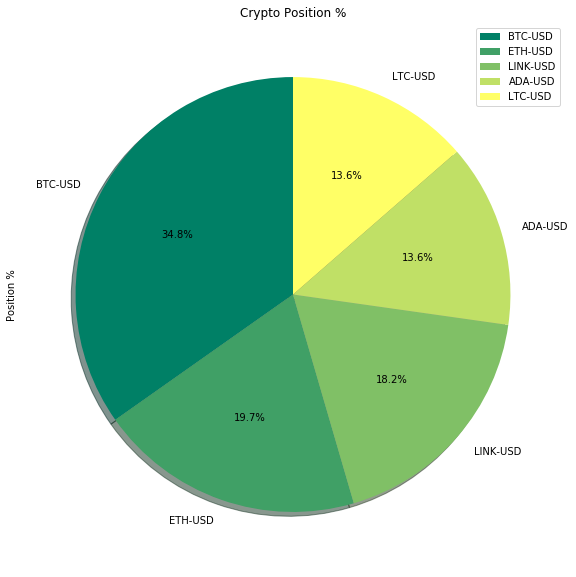

In [7]:
# Create a Pie Chart of the Portfolio Data
cryptoportsorted = cryptoportfoliotable.sort_values(['Position %'], ascending=False)

cryptoportsorted = cryptoportsorted.plot(kind='pie', y='Position %', shadow = True, startangle=90,
                                figsize=(15,10), autopct='%1.1f%%', title='Crypto Position %', colormap='summer')

In [8]:
#Total Portfolio Data
totalportfoliotable = pd.concat([stockportfoliotable, cryptoportfoliotable])
del totalportfoliotable['Position %']
totalcostbasis = stocktotalcostbasis + cryptototalcostbasis
totalportfoliotable['Position %'] = totalportfoliotable['Cost Basis'] / totalcostbasis
totalportfoliotable

,Amount,Cost,Cost Basis,Position %
Asset,,,,
2357.TW,100,367,36700,0.0784269
AAPL,1000,25.91,25910,0.0553689
AC.TO,1000,28.13,28130,0.060113
CCL,1000,23.76,23760,0.0507744
CM-PQ.TO,1000,15.19,15190,0.0324606
F,100,265.02,26502,0.056634
MSFT,100,761.24,76124,0.162675
NVDA,1000,38.98,38980,0.0832992
PFE,100,349.46,34946,0.0746786


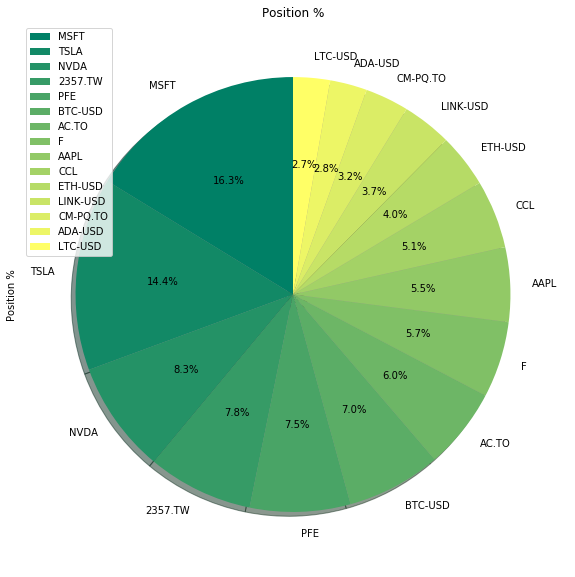

In [9]:
# Create a Pie Chart of the Portfolio Data
totalportsorted = totalportfoliotable.sort_values(['Position %'], ascending=False)

totalportsorted = totalportsorted.plot(kind='pie', y='Position %', shadow = True, startangle=90,
                                figsize=(15,10), autopct='%1.1f%%', title='Position %', colormap='summer')

In [10]:
# Stock Data
stock_close = yf.download(stocks, group_by='Ticker', period='10y')

# Create CSV of ticker data
stock_close.to_csv('stocks.csv')

stock_close = stock_close.stack(level=0).rename_axis(['Date', 'Ticker']).reset_index(level=1)

stock_close = pd.read_csv('stocks.csv', header=[0, 1])
stock_close.drop([0], axis=0, inplace=True)  # drop this row because it only has one column with Date in it
stock_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')] = pd.to_datetime(stock_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')], format='%Y-%m-%d')  # convert the first column to a datetime
stock_close.set_index(('Unnamed: 0_level_0', 'Unnamed: 0_level_1'), inplace=True)  # set the first column as the index
stock_close.index.name = None

# Drop Null Information
stock_close = stock_close.dropna()

# Sort Multi-Index To Match Weights
stock_close = stock_close.reindex(sorted(stock_close.columns), axis=1)

stock_close

[*********************100%***********************]  10 of 10 completed


2357.TW                                               AAPL  \
             Adj Close  Close   High    Low   Open     Volume   Adj Close   
2015-03-11  223.824799  322.0  326.5  322.0  323.0  2017000.0   27.859491   
2015-03-12  225.215042  324.0  325.5  321.5  322.0  1818000.0   28.363159   
2015-03-13  224.172363  322.5  325.0  322.0  323.0  2127000.0   28.167162   
2015-03-16  221.044373  318.0  323.0  316.0  320.0  4840000.0   28.477116   
2015-03-17  220.696838  317.5  322.5  315.0  320.5  3586000.0   28.953447   
...                ...    ...    ...    ...    ...        ...         ...   
2021-06-30  371.500000  371.5  375.0  370.0  371.5  2792667.0  136.960007   
2021-07-02  371.000000  371.0  372.0  367.0  368.5  1789983.0  139.960007   
2021-07-06  376.000000  376.0  378.0  375.5  378.0  1698955.0  142.020004   
2021-07-07  379.000000  379.0  379.5  375.5  376.0  1743026.0  144.570007   
2021-07-08  381.000000  381.0  382.0  379.0  382.0  2226513.0  143.240005   

                                                ...        PFE             \
                 Close        High         Low  ...       High        Low   
2015-03-11   30.559999   31.192499   30.527500  ...  32.352940  31.907021   
2015-03-12   31.112499   31.225000   30.407499  ...  32.314991  32.049335   
2015-03-13   30.897499   31.350000   30.645000  ...  32.258064  31.973434   
2015-03-16   31.237499   31.237499   30.717501  ...  32.789375  32.220116   
2015-03-17   31.760000   31.830000   31.412500  ...  32.542694  32.201138   
...                ...         ...         ...  ...        ...        ...   
2021-06-30  136.960007  137.410004  135.869995  ...  39.270000  38.820000   
2021-07-02  139.960007  140.000000  137.750000  ...  39.830002  39.380001   
2021-07-06  142.020004  143.149994  140.070007  ...  39.650002  39.040001   
2021-07-07  144.570007  144.889999  142.660004  ...  39.360001  38.970001   
2021-07-08  143.240005  144.059998  140.669998  ...  39.314999  38.930099   

                                         TSLA                          \
                 Open      Volume   Adj Close       Close        High   
2015-03-11  32.239090  26996840.0   38.748001   38.748001   39.236000   
2015-03-12  32.077801  29699085.0   38.214001   38.214001   38.889999   
2015-03-13  32.182163  29596847.0   37.736000   37.736000   38.349998   
2015-03-16  32.333965  30615643.0   39.139999   39.139999   39.181999   
2015-03-17  32.371918  21746760.0   38.945999   38.945999   39.742001   
...               ...         ...         ...         ...         ...   
2021-06-30  39.139999  21248100.0  679.700012  679.700012  692.809998   
2021-07-02  39.459999  16592700.0  678.900024  678.900024  700.000000   
2021-07-06  39.480000  18931900.0  659.580017  659.580017  684.000000   
2021-07-07  39.220001  17657500.0  644.650024  644.650024  665.700012   
2021-07-08  39.000000  23021184.0  652.809998  652.809998  654.429993   

                                                
                   Low        Open      Volume  
2015-03-11   38.202000   38.230000  24874500.0  
2015-03-12   37.950001   38.750000  20746500.0  
2015-03-13   37.464001   37.790001  27171500.0  
2015-03-16   37.959999   38.400002  28144000.0  
2015-03-17   38.787998   39.085999  24470500.0  
...                ...         ...         ...  
2021-06-30  678.140015  679.770020  18924900.0  
2021-07-02  673.260010  678.979980  27054500.0  
2021-07-06  651.400024  681.710022  23284500.0  
2021-07-07  638.320007  664.270020  18750300.0  
2021-07-08  620.460022  628.369995  22773316.0  

[1468 rows x 60 columns]

In [11]:
#Stock Average True Range (ATR)
def Average_True_Range(stock_close,Ticker):
    high_low = stock_close[Ticker]['High'] - stock_close[Ticker]['Low']
    high_cp = np.abs(stock_close[Ticker]['High'] - stock_close[Ticker]['Close'].shift())
    low_cp = np.abs(stock_close[Ticker]['Low'] - stock_close[Ticker]['Close'].shift())
    df = pd.concat([high_low, high_cp, low_cp], axis = 1)
    tr = np.max(df, axis = 1)
    average_true_range = tr.rolling(14).mean()
    return average_true_range[-1]
stocksatr = []
for i in stocks:
     stocksatr.append(Average_True_Range(stock_close, i))
        
#Stocks Close Price
def Close_Price(stock_close,Ticker):
    close_price = stock_close[Ticker]['Close']
    return close_price[-1]
stockclose = []
for i in stocks:
    stockclose.append(Close_Price(stock_close, i))

#Market Value for Stocks
stockportfoliotable['Recent Close'] = stockclose
stockportfoliotable['Market Value'] = stockportfoliotable['Recent Close'] * stockportfoliotable['Amount']

#Stocks Portifolio with ATR
stockportfoliotable['ATR'] = stocksatr
stockportfoliotable['ATR %'] = stockportfoliotable['ATR'] / stockportfoliotable['Recent Close']
stockportfoliotable

,Amount,Cost,Cost Basis,Position %,Recent Close,Market Value,ATR,ATR %
Asset,,,,,,,,
2357.TW,100,367,36700,0.0982784,381.000000,38100,5.821429,0.015279
AAPL,1000,25.91,25910,0.069384,143.240005,143240,2.343572,0.016361
AC.TO,1000,28.13,28130,0.0753289,25.670000,25670,0.781428,0.030441
CCL,1000,23.76,23760,0.0636266,23.719999,23720,1.040357,0.043860
CM-PQ.TO,1000,15.19,15190,0.0406771,23.650000,23650,0.135715,0.005738
F,100,265.02,26502,0.0709693,14.060000,1406,0.424643,0.030202
MSFT,100,761.24,76124,0.203851,277.420013,27742,3.990712,0.014385
NVDA,1000,38.98,38980,0.104384,796.109985,796110,23.828574,0.029931
PFE,100,349.46,34946,0.0935814,39.250000,3925,0.509278,0.012975


In [12]:
#Total Market value for Stocks
totalstockvalue = stockportfoliotable['Market Value'].sum()
totalstockvalue

1148843.9909934998

In [13]:
# Configuring a Monte Carlo simulation to forecast 1 year cumulative returns
MC_stock_one_year = MCSimulation(
    portfolio_data = stock_close,
    weights = stockweight,
    num_simulation = 1000,
    num_trading_days = 252 * 1
)

In [14]:
# Printing the simulation input data
MC_stock_one_year.portfolio_data.head()

2357.TW                                                      \
             Adj Close  Close   High    Low   Open     Volume daily_return   
2015-03-11  223.824799  322.0  326.5  322.0  323.0  2017000.0          NaN   
2015-03-12  225.215042  324.0  325.5  321.5  322.0  1818000.0     0.006211   
2015-03-13  224.172363  322.5  325.0  322.0  323.0  2127000.0    -0.004630   
2015-03-16  221.044373  318.0  323.0  316.0  320.0  4840000.0    -0.013953   
2015-03-17  220.696838  317.5  322.5  315.0  320.5  3586000.0    -0.001572   

                 AAPL                        ...        PFE              \
            Adj Close      Close       High  ...       Open      Volume   
2015-03-11  27.859491  30.559999  31.192499  ...  32.239090  26996840.0   
2015-03-12  28.363159  31.112499  31.225000  ...  32.077801  29699085.0   
2015-03-13  28.167162  30.897499  31.350000  ...  32.182163  29596847.0   
2015-03-16  28.477116  31.237499  31.237499  ...  32.333965  30615643.0   
2015-03-17  28.953447  31.760000  31.830000  ...  32.371918  21746760.0   

                              TSLA                                   \
           daily_return  Adj Close      Close       High        Low   
2015-03-11          NaN  38.748001  38.748001  39.236000  38.202000   
2015-03-12     0.011002  38.214001  38.214001  38.889999  37.950001   
2015-03-13     0.000000  37.736000  37.736000  38.349998  37.464001   
2015-03-16     0.012941  39.139999  39.139999  39.181999  37.959999   
2015-03-17    -0.007840  38.945999  38.945999  39.742001  38.787998   

                                                
                 Open      Volume daily_return  
2015-03-11  38.230000  24874500.0          NaN  
2015-03-12  38.750000  20746500.0    -0.013781  
2015-03-13  37.790001  27171500.0    -0.012509  
2015-03-16  38.400002  28144000.0     0.037206  
2015-03-17  39.085999  24470500.0    -0.004957  

[5 rows x 70 columns]

In [15]:
# Running a Monte Carlo simulation to forecast 1 year cumulative returns
MC_stock_one_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.005989,1.011750,1.003506,0.994231,1.019023,1.015752,0.994861,1.004009,1.006014,0.998909,...,1.004271,0.997255,0.997976,0.996619,1.006720,1.006700,1.013001,1.004680,1.021070,1.001684
2,0.995794,1.019338,0.999377,1.001571,1.024581,1.009737,0.993231,0.996779,1.014748,0.990110,...,1.009121,0.997141,1.001102,0.996320,0.995393,1.018427,1.017210,1.008843,1.043481,0.994379
3,0.999757,1.018660,0.985713,1.007414,1.024270,1.015349,0.997323,0.994115,1.028797,0.988490,...,1.014191,0.982796,1.020618,0.998951,0.989801,1.026705,1.016915,0.975353,1.038928,1.002537
4,0.990600,1.006830,0.985552,1.005187,1.029316,1.012091,1.008547,0.990900,1.042736,0.989473,...,1.014618,0.989912,1.016991,0.992330,0.983273,1.026794,1.013725,0.979160,1.045240,1.005316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.284792,0.991484,1.537717,1.375170,1.327489,1.791962,1.408194,1.417751,1.738700,1.714305,...,1.397289,1.385442,1.343871,1.261870,1.215793,1.307218,1.464040,1.112652,1.272693,1.420110
249,1.278757,0.990758,1.542413,1.369539,1.318820,1.801498,1.401151,1.442007,1.772189,1.718313,...,1.398702,1.406477,1.336049,1.280625,1.210473,1.311653,1.472465,1.124197,1.259217,1.417311
250,1.306222,0.985860,1.544047,1.371593,1.293885,1.791939,1.387371,1.414275,1.770295,1.725958,...,1.391747,1.406454,1.335251,1.274812,1.197131,1.327063,1.455375,1.120190,1.277829,1.406677
251,1.313977,0.988620,1.530481,1.384374,1.291608,1.802470,1.414319,1.396404,1.760783,1.712064,...,1.400322,1.405513,1.344550,1.284053,1.208720,1.333669,1.454596,1.116452,1.281874,1.419340


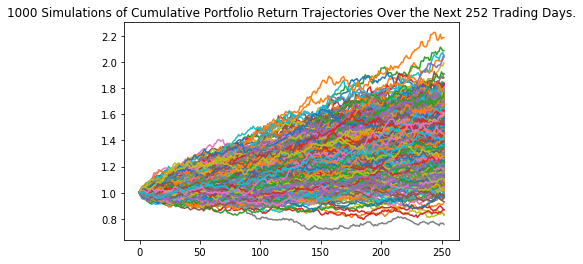

In [16]:
# Plot simulation outcomes
stock_oneyr_line_plot = MC_stock_one_year.plot_simulation()

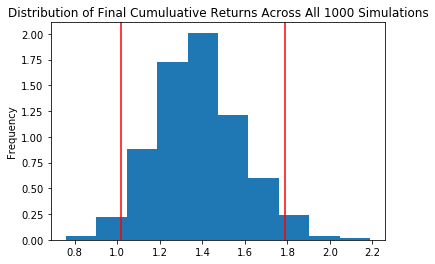

In [17]:
# Plot probability distribution and confidence intervals
stock_oneyr_dist_plot = MC_stock_one_year.plot_distribution()

In [18]:
# Fetch summary statistics from the Monte Carlo simulation results
stock_oneyr_tbl = MC_stock_one_year.summarize_cumulative_return()

# Print summary statistics
print(stock_oneyr_tbl)

count           1000.000000
mean               1.381455
std                0.200603
min                0.757401
25%                1.248039
50%                1.365197
75%                1.506985
max                2.189126
95% CI Lower       1.019124
95% CI Upper       1.786464
Name: 252, dtype: float64


In [19]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_stockone = round(stock_oneyr_tbl[8],2)
ci_mean_stockone = round(stock_oneyr_tbl[1],2)
ci_upper_stockone = round(stock_oneyr_tbl[9],2)

print(ci_lower_stockone, ci_mean_stockone, ci_upper_stockone)

1.02 1.38 1.79


In [20]:
# Configuring a Monte Carlo simulation to forecast 5 year cumulative returns
MC_stock_five_year = MCSimulation(
    portfolio_data = stock_close,
    weights = stockweight,
    num_simulation = 1000,
    num_trading_days = 252 * 5
)

In [21]:
# Printing the simulation input data
MC_stock_five_year.portfolio_data.head()

2357.TW                                                      \
             Adj Close  Close   High    Low   Open     Volume daily_return   
2015-03-11  223.824799  322.0  326.5  322.0  323.0  2017000.0          NaN   
2015-03-12  225.215042  324.0  325.5  321.5  322.0  1818000.0     0.006211   
2015-03-13  224.172363  322.5  325.0  322.0  323.0  2127000.0    -0.004630   
2015-03-16  221.044373  318.0  323.0  316.0  320.0  4840000.0    -0.013953   
2015-03-17  220.696838  317.5  322.5  315.0  320.5  3586000.0    -0.001572   

                 AAPL                        ...        PFE              \
            Adj Close      Close       High  ...       Open      Volume   
2015-03-11  27.859491  30.559999  31.192499  ...  32.239090  26996840.0   
2015-03-12  28.363159  31.112499  31.225000  ...  32.077801  29699085.0   
2015-03-13  28.167162  30.897499  31.350000  ...  32.182163  29596847.0   
2015-03-16  28.477116  31.237499  31.237499  ...  32.333965  30615643.0   
2015-03-17  28.953447  31.760000  31.830000  ...  32.371918  21746760.0   

                              TSLA                                   \
           daily_return  Adj Close      Close       High        Low   
2015-03-11          NaN  38.748001  38.748001  39.236000  38.202000   
2015-03-12     0.011002  38.214001  38.214001  38.889999  37.950001   
2015-03-13     0.000000  37.736000  37.736000  38.349998  37.464001   
2015-03-16     0.012941  39.139999  39.139999  39.181999  37.959999   
2015-03-17    -0.007840  38.945999  38.945999  39.742001  38.787998   

                                                
                 Open      Volume daily_return  
2015-03-11  38.230000  24874500.0          NaN  
2015-03-12  38.750000  20746500.0    -0.013781  
2015-03-13  37.790001  27171500.0    -0.012509  
2015-03-16  38.400002  28144000.0     0.037206  
2015-03-17  39.085999  24470500.0    -0.004957  

[5 rows x 70 columns]

In [22]:
# Running a Monte Carlo simulation to forecast 5 year cumulative returns
MC_stock_five_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.999885,0.984979,1.004737,1.009646,0.997500,0.997819,1.005463,0.994141,1.015711,1.005864,...,0.991666,0.994582,1.001366,1.009880,1.001144,1.018656,1.009941,0.992540,1.001196,1.027835
2,0.994100,0.988767,0.997890,1.003720,0.983152,1.003358,1.010506,0.983251,1.013374,1.009602,...,1.005500,1.005576,1.023492,1.016162,1.008069,1.013447,1.022546,0.989133,0.986650,1.009715
3,0.996474,0.957208,1.003029,1.022082,1.005446,1.005717,1.006325,0.982966,1.011252,1.007381,...,1.001627,1.013327,1.016760,1.009475,1.004837,1.004810,0.997379,0.997471,0.982144,1.005061
4,1.019130,0.953943,1.011157,1.031358,1.005211,0.995601,0.999193,0.978444,0.999670,1.011640,...,1.002482,1.012805,1.019065,1.020407,1.007334,0.996446,0.977287,1.005584,0.966503,1.003743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,6.900368,9.407164,5.475573,3.483286,2.975268,4.648376,3.635237,5.034794,7.880442,8.507724,...,3.519120,4.569644,5.742551,6.109167,3.702020,9.418550,4.066768,8.608111,4.070677,3.037556
1257,6.965383,9.522658,5.435198,3.490044,2.981185,4.650007,3.598991,5.141911,7.914155,8.561254,...,3.562205,4.583593,5.760476,6.201844,3.770154,9.499754,4.160448,8.686919,4.053265,3.126790
1258,6.940129,9.477855,5.398583,3.512047,2.975498,4.583513,3.625674,5.112514,7.926070,8.526227,...,3.575153,4.563366,5.718078,6.334081,3.746342,9.604457,4.218685,8.774558,4.024267,3.103647
1259,7.087552,9.534632,5.406660,3.454829,2.942723,4.700864,3.609741,5.154465,7.863402,8.540103,...,3.621377,4.541793,5.651389,6.385329,3.675945,9.665250,4.222697,8.713559,4.075370,3.097849


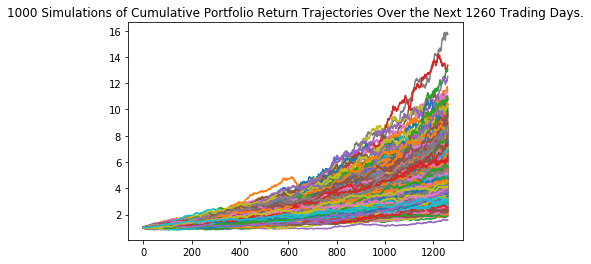

In [23]:
# Plot simulation outcomes
stock_fiveyr_line_plot = MC_stock_five_year.plot_simulation()

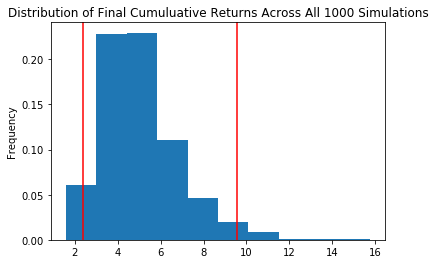

In [24]:
# Plot probability distribution and confidence intervals
stock_fiveyr_dist_plot = MC_stock_five_year.plot_distribution()

In [25]:
# Fetch summary statistics from the Monte Carlo simulation results
stock_fiveyr_tbl = MC_stock_five_year.summarize_cumulative_return()

# Print summary statistics
print(stock_fiveyr_tbl)

count           1000.000000
mean               5.048634
std                1.796397
min                1.591607
25%                3.807446
50%                4.731391
75%                5.944205
max               15.755384
95% CI Lower       2.389405
95% CI Upper       9.544801
Name: 1260, dtype: float64


In [26]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_stockfive = round(stock_fiveyr_tbl[8],2)
ci_mean_stockfive = round(stock_fiveyr_tbl[1],2)
ci_upper_stockfive = round(stock_fiveyr_tbl[9],2)

print(ci_lower_stockfive, ci_mean_stockfive, ci_upper_stockfive)

2.39 5.05 9.54


In [27]:
# Crypto Data
crypto_close = yf.download(crypto, group_by='Ticker', period='10y')

# Create CSV of ticker data
crypto_close.to_csv('crypto.csv')

crypto_close = crypto_close.stack(level=0).rename_axis(['Date', 'Ticker']).reset_index(level=1)

crypto_close = pd.read_csv('crypto.csv', header=[0, 1])
crypto_close.drop([0], axis=0, inplace=True)  # drop this row because it only has one column with Date in it
crypto_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')] = pd.to_datetime(crypto_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')], format='%Y-%m-%d')  # convert the first column to a datetime
crypto_close.set_index(('Unnamed: 0_level_0', 'Unnamed: 0_level_1'), inplace=True)  # set the first column as the index
crypto_close.index.name = None

# Drop Null Information
crypto_close = crypto_close.dropna()

# Sort Multi-Index To Match Weights
crypto_close = crypto_close.reindex(sorted(crypto_close.columns), axis=1)

crypto_close

[*********************100%***********************]  5 of 5 completed


ADA-USD                                                        \
           Adj Close     Close      High       Low      Open        Volume   
2017-10-01  0.024969  0.024969  0.032226  0.017354  0.021678  5.006870e+07   
2017-10-02  0.025932  0.025932  0.030088  0.019969  0.024607  5.764130e+07   
2017-10-03  0.020816  0.020816  0.027425  0.020690  0.025757  1.699780e+07   
2017-10-04  0.021931  0.021931  0.022806  0.020864  0.020864  9.000050e+06   
2017-10-05  0.021489  0.021489  0.022154  0.020859  0.021951  5.562510e+06   
...              ...       ...       ...       ...       ...           ...   
2021-07-04  1.458184  1.458184  1.493717  1.382153  1.404008  1.806362e+09   
2021-07-05  1.404898  1.404898  1.461221  1.379284  1.461221  1.759461e+09   
2021-07-06  1.418053  1.418053  1.456887  1.393282  1.404712  1.477700e+09   
2021-07-07  1.403118  1.403118  1.440113  1.401327  1.416153  1.349406e+09   
2021-07-09  1.303962  1.303962  1.323828  1.301116  1.323828  1.590306e+09   

                 BTC-USD                                            ...  \
               Adj Close         Close          High           Low  ...   
2017-10-01   4403.740234   4403.740234   4403.740234   4269.810059  ...   
2017-10-02   4409.319824   4409.319824   4470.229980   4377.459961  ...   
2017-10-03   4317.479980   4317.479980   4432.470215   4258.890137  ...   
2017-10-04   4229.359863   4229.359863   4352.310059   4210.419922  ...   
2017-10-05   4328.410156   4328.410156   4362.640137   4164.049805  ...   
...                  ...           ...           ...           ...  ...   
2021-07-04  35287.781250  35287.781250  35937.566406  34396.476562  ...   
2021-07-05  33746.003906  33746.003906  35284.343750  33213.660156  ...   
2021-07-06  34235.195312  34235.195312  35038.535156  33599.917969  ...   
2021-07-07  33855.328125  33855.328125  34997.664062  33839.289062  ...   
2021-07-09  32479.857422  32479.857422  32845.578125  32479.857422  ...   

             LINK-USD                                         LTC-USD  \
                 High        Low       Open        Volume   Adj Close   
2017-10-01   0.451884   0.382034   0.451547  1.000510e+07   54.543301   
2017-10-02   0.440264   0.356767   0.437667  7.101340e+06   53.375999   
2017-10-03   0.367254   0.295817   0.367254  8.211990e+06   52.349602   
2017-10-04   0.398695   0.336883   0.343186  7.604930e+06   51.399502   
2017-10-05   0.417906   0.378043   0.397030  6.291110e+06   51.669498   
...               ...        ...        ...           ...         ...   
2021-07-04  19.894503  18.028957  18.548805  6.802681e+08  144.905853   
2021-07-05  19.246891  17.814753  19.246891  6.986191e+08  138.073242   
2021-07-06  20.240997  18.351877  18.351877  1.156986e+09  138.985641   
2021-07-07  21.227631  19.643406  20.091469  1.110848e+09  137.371216   
2021-07-09  18.287361  17.874294  18.287361  1.023020e+09  128.448456   

                                                                          
                 Close        High         Low        Open        Volume  
2017-10-01   54.543301   55.161598   53.625198   55.136200  1.001830e+08  
2017-10-02   53.375999   54.784801   53.257999   54.546902  9.547460e+07  
2017-10-03   52.349602   53.592999   51.586601   53.390400  8.851610e+07  
2017-10-04   51.399502   53.046101   50.830399   52.284302  7.747340e+07  
2017-10-05   51.669498   51.865501   50.440498   51.401402  6.959440e+07  
...                ...         ...         ...         ...           ...  
2021-07-04  144.905853  147.836060  137.096420  140.317993  1.431657e+09  
2021-07-05  138.073242  144.849335  134.960266  144.849335  1.338246e+09  
2021-07-06  138.985641  142.703568  135.924835  137.951675  1.504907e+09  
2021-07-07  137.371216  142.900574  137.183868  138.960159  1.594184e+09  
2021-07-09  128.448456  131.878983  128.448456  131.878983  1.598413e+09  

[1373 rows x 30 columns]

In [28]:
#Crypto Average True Range (ATR)
def Average_True_Range(crypto_close,Ticker):
    high_low = crypto_close[Ticker]['High'] - crypto_close[Ticker]['Low']
    high_cp = np.abs(crypto_close[Ticker]['High'] - crypto_close[Ticker]['Close'].shift())
    low_cp = np.abs(crypto_close[Ticker]['Low'] - crypto_close[Ticker]['Close'].shift())
    df = pd.concat([high_low, high_cp, low_cp], axis = 1)
    tr = np.max(df, axis = 1)
    average_true_range = tr.rolling(14).mean()
    return average_true_range[-1]
cryptoatr = []
for i in crypto:
    cryptoatr.append(Average_True_Range(crypto_close, i))

#Crypto Close Price
def Close_Price(crypto_close,Ticker):
    close_price = crypto_close[Ticker]['Close']
    return close_price[-1]
cryptoclose = []
for i in crypto:
    cryptoclose.append(Close_Price(crypto_close, i))

#Market Value for Crypto
cryptoportfoliotable['Recent Close'] = cryptoclose
cryptoportfoliotable['Market Value'] = cryptoportfoliotable['Recent Close'] * cryptoportfoliotable['Amount']
    
#Crypto Portifolio with ATR
cryptoportfoliotable['ATR'] = cryptoatr
cryptoportfoliotable['ATR %'] = cryptoportfoliotable['ATR'] / cryptoportfoliotable['Recent Close']
cryptoportfoliotable

,Amount,Cost,Cost Basis,Position %,Recent Close,Market Value,ATR,ATR %
Asset,,,,,,,,
ADA-USD,10000,1.2902,12902,0.136496,1.303962,13039.6,0.090481,0.069390
BTC-USD,1,32870.8,32870.8,0.347755,32479.857422,32479.9,1942.147879,0.059795
ETH-USD,10,1865.51,18655.1,0.197361,2075.321289,20753.2,168.053624,0.080977
LINK-USD,1000,17.25,17250,0.182495,17.894495,17894.5,1.676222,0.093673
LTC-USD,100,128.45,12845,0.135893,128.448456,12844.8,9.173803,0.071420


In [29]:
#Total Market value for Crypto
totalcryptovalue = cryptoportfoliotable['Market Value'].sum()
totalcryptovalue

97012.03440284729

In [30]:
# Configuring a Monte Carlo simulation to forecast 1 year cumulative returns
MC_crypto_one_year = MCSimulation(
    portfolio_data = crypto_close,
    weights = cryptoweight,
    num_simulation = 1000,
    num_trading_days = 252 * 1
)

In [31]:
# Printing the simulation input data
MC_crypto_one_year.portfolio_data.head()

ADA-USD                                                      \
           Adj Close     Close      High       Low      Open      Volume   
2017-10-01  0.024969  0.024969  0.032226  0.017354  0.021678  50068700.0   
2017-10-02  0.025932  0.025932  0.030088  0.019969  0.024607  57641300.0   
2017-10-03  0.020816  0.020816  0.027425  0.020690  0.025757  16997800.0   
2017-10-04  0.021931  0.021931  0.022806  0.020864  0.020864   9000050.0   
2017-10-05  0.021489  0.021489  0.022154  0.020859  0.021951   5562510.0   

                             BTC-USD                            ...  LINK-USD  \
           daily_return    Adj Close        Close         High  ...      Open   
2017-10-01          NaN  4403.740234  4403.740234  4403.740234  ...  0.451547   
2017-10-02     0.038568  4409.319824  4409.319824  4470.229980  ...  0.437667   
2017-10-03    -0.197285  4317.479980  4317.479980  4432.470215  ...  0.367254   
2017-10-04     0.053565  4229.359863  4229.359863  4352.310059  ...  0.343186   
2017-10-05    -0.020154  4328.410156  4328.410156  4362.640137  ...  0.397030   

                                       LTC-USD                        \
                Volume daily_return  Adj Close      Close       High   
2017-10-01  10005100.0          NaN  54.543301  54.543301  55.161598   
2017-10-02   7101340.0    -0.182940  53.375999  53.375999  54.784801   
2017-10-03   8211990.0    -0.031483  52.349602  52.349602  53.592999   
2017-10-04   7604930.0     0.149988  51.399502  51.399502  53.046101   
2017-10-05   6291110.0     0.023095  51.669498  51.669498  51.865501   

                                                            
                  Low       Open       Volume daily_return  
2017-10-01  53.625198  55.136200  100183000.0          NaN  
2017-10-02  53.257999  54.546902   95474600.0    -0.021401  
2017-10-03  51.586601  53.390400   88516096.0    -0.019230  
2017-10-04  50.830399  52.284302   77473400.0    -0.018149  
2017-10-05  50.440498  51.401402   69594400.0     0.005253  

[5 rows x 35 columns]

In [32]:
# Running a Monte Carlo simulation to forecast 1 year cumulative returns
MC_crypto_one_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.997008,0.982892,1.048494,0.988856,0.968927,0.996595,1.029073,0.997270,0.983506,0.983620,...,1.004181,0.992298,1.016471,0.981026,1.022108,0.999420,0.987173,1.033330,1.039901,1.016944
2,1.057264,0.966172,1.092544,0.997252,0.967645,0.947942,0.998606,0.989829,0.968863,1.007403,...,1.052895,1.004849,0.960074,1.028522,1.035892,1.034164,1.016883,1.060819,1.028348,1.018993
3,1.123401,0.976165,1.080317,0.986983,0.957352,0.948681,0.996593,0.989804,0.948293,0.994856,...,1.056005,1.015904,0.980571,1.005805,1.082120,0.997113,1.058010,1.072748,1.048175,1.024948
4,1.102837,0.942852,1.081789,0.993017,0.954962,0.945678,0.962739,0.975412,0.989921,1.064908,...,1.064162,0.962280,0.996994,1.002562,1.055116,0.990179,1.078019,1.066784,1.063223,1.035632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,2.239132,5.260766,2.992845,2.152686,5.470588,3.300429,1.399727,4.405388,1.200186,0.759118,...,2.965763,1.624715,4.378435,1.857276,2.790939,2.267984,0.927932,5.208328,1.992109,3.117803
249,2.185017,5.295417,3.056067,2.114714,5.425090,3.183700,1.423775,4.526900,1.177059,0.746506,...,3.039867,1.656307,4.389574,1.819838,2.804096,2.292949,0.939063,5.218050,1.987901,3.116141
250,2.154694,5.454676,3.241067,2.058484,5.568716,3.140353,1.357083,4.540749,1.171817,0.743705,...,2.913057,1.646242,4.299258,1.787139,2.801418,2.364036,0.957348,5.416175,2.032596,3.147994
251,2.141527,5.527342,3.081105,2.101694,5.667073,3.288118,1.377481,4.605937,1.178903,0.727840,...,3.030304,1.706948,4.187667,1.808652,2.917789,2.356096,0.949309,5.661786,2.079372,3.190211


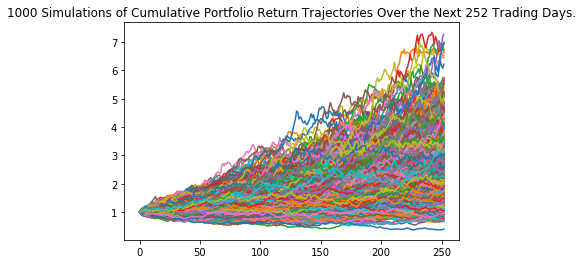

In [33]:
# Plot simulation outcomes
crypto_oneyr_line_plot = MC_crypto_one_year.plot_simulation()

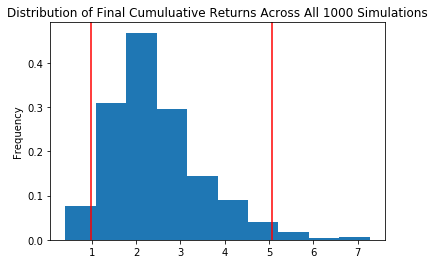

In [34]:
# Plot probability distribution and confidence intervals
crypto_oneyr_dist_plot = MC_crypto_one_year.plot_distribution()

In [35]:
# Fetch summary statistics from the Monte Carlo simulation results
crypto_oneyr_tbl = MC_crypto_one_year.summarize_cumulative_return()

# Print summary statistics
print(crypto_oneyr_tbl)

count           1000.000000
mean               2.472232
std                1.053430
min                0.403256
25%                1.738760
50%                2.305117
75%                3.023075
max                7.273212
95% CI Lower       0.970799
95% CI Upper       5.061473
Name: 252, dtype: float64


In [36]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_cryptoone = round(crypto_oneyr_tbl[8],2)
ci_mean_cryptoone = round(crypto_oneyr_tbl[1],2)
ci_upper_cryptoone = round(crypto_oneyr_tbl[9],2)

print(ci_lower_cryptoone, ci_mean_cryptoone, ci_upper_cryptoone)

0.97 2.47 5.06


In [37]:
# Configuring a Monte Carlo simulation to forecast 5 year cumulative returns
MC_crypto_five_year = MCSimulation(
    portfolio_data = crypto_close,
    weights = cryptoweight,
    num_simulation = 1000,
    num_trading_days = 252 * 5
)

In [38]:
# Printing the simulation input data
MC_crypto_five_year.portfolio_data.head()

ADA-USD                                                      \
           Adj Close     Close      High       Low      Open      Volume   
2017-10-01  0.024969  0.024969  0.032226  0.017354  0.021678  50068700.0   
2017-10-02  0.025932  0.025932  0.030088  0.019969  0.024607  57641300.0   
2017-10-03  0.020816  0.020816  0.027425  0.020690  0.025757  16997800.0   
2017-10-04  0.021931  0.021931  0.022806  0.020864  0.020864   9000050.0   
2017-10-05  0.021489  0.021489  0.022154  0.020859  0.021951   5562510.0   

                             BTC-USD                            ...  LINK-USD  \
           daily_return    Adj Close        Close         High  ...      Open   
2017-10-01          NaN  4403.740234  4403.740234  4403.740234  ...  0.451547   
2017-10-02     0.038568  4409.319824  4409.319824  4470.229980  ...  0.437667   
2017-10-03    -0.197285  4317.479980  4317.479980  4432.470215  ...  0.367254   
2017-10-04     0.053565  4229.359863  4229.359863  4352.310059  ...  0.343186   
2017-10-05    -0.020154  4328.410156  4328.410156  4362.640137  ...  0.397030   

                                       LTC-USD                        \
                Volume daily_return  Adj Close      Close       High   
2017-10-01  10005100.0          NaN  54.543301  54.543301  55.161598   
2017-10-02   7101340.0    -0.182940  53.375999  53.375999  54.784801   
2017-10-03   8211990.0    -0.031483  52.349602  52.349602  53.592999   
2017-10-04   7604930.0     0.149988  51.399502  51.399502  53.046101   
2017-10-05   6291110.0     0.023095  51.669498  51.669498  51.865501   

                                                            
                  Low       Open       Volume daily_return  
2017-10-01  53.625198  55.136200  100183000.0          NaN  
2017-10-02  53.257999  54.546902   95474600.0    -0.021401  
2017-10-03  51.586601  53.390400   88516096.0    -0.019230  
2017-10-04  50.830399  52.284302   77473400.0    -0.018149  
2017-10-05  50.440498  51.401402   69594400.0     0.005253  

[5 rows x 35 columns]

In [39]:
# Running a Monte Carlo simulation to forecast 5 year cumulative returns
MC_crypto_five_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.014934,1.005354,1.068795,0.995048,1.064144,1.013152,0.974721,1.047189,0.981543,1.025171,...,1.007386,1.018041,1.049269,1.016792,1.007585,0.995676,0.948774,1.017874,1.004902,1.019611
2,1.009005,1.077888,1.080225,0.989512,1.018976,1.014932,0.931998,1.030346,1.000823,1.073861,...,0.969025,1.031780,1.060126,1.019339,0.983201,0.999821,0.944859,1.033128,1.003133,1.053699
3,1.051685,1.085249,1.075643,0.984972,1.007570,1.022387,0.970379,1.041002,1.034658,1.071778,...,0.975897,0.966572,1.039746,1.014197,0.999946,0.996277,0.963730,0.981623,1.015728,1.076255
4,1.093096,1.056610,1.060521,1.012833,1.050045,0.988586,0.975766,1.025792,1.009853,1.112337,...,0.952713,0.991155,1.079106,1.013289,0.968097,1.016081,0.955025,0.982673,0.958322,1.054422
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,193.386579,52.199297,223.428175,30.721557,45.936816,65.735431,43.233991,18.440175,70.795746,24.543350,...,161.430063,109.505724,72.369911,87.746972,56.130758,199.741707,9.941750,15.771098,77.974721,67.433265
1257,202.437804,51.807214,230.159822,30.277300,47.492931,66.153073,43.739790,18.425445,68.434427,24.685206,...,165.466588,114.244973,72.634610,87.346520,56.645424,192.382398,10.169547,15.489157,78.028821,64.903450
1258,196.599389,50.775222,230.172874,30.210003,47.165741,67.945380,44.536944,18.696294,69.431266,24.373025,...,166.702297,113.570668,71.569359,93.749055,54.937640,199.997847,10.328796,15.605544,82.510236,64.009463
1259,200.002521,48.498885,224.898531,31.439281,46.945316,68.671929,43.317981,18.309485,70.137621,24.281028,...,169.425371,117.125524,74.489539,93.634579,55.890334,201.474966,10.037775,16.131812,82.734227,67.919287


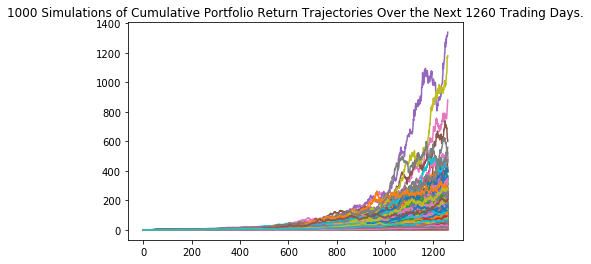

In [40]:
# Plot simulation outcomes
crypto_fiveyr_line_plot = MC_crypto_five_year.plot_simulation()

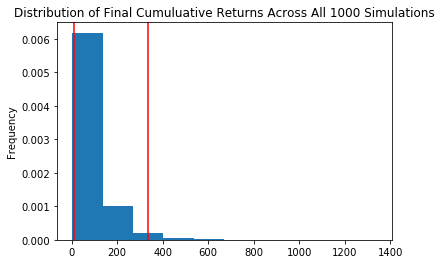

In [41]:
# Plot probability distribution and confidence intervals
crypto_fiveyr_dist_plot = MC_crypto_five_year.plot_distribution()

In [42]:
# Fetch summary statistics from the Monte Carlo simulation results
crypto_fiveyr_tbl = MC_crypto_five_year.summarize_cumulative_return()

# Print summary statistics
print(crypto_fiveyr_tbl)

count           1000.000000
mean              84.365269
std               99.932533
min                1.905812
25%               28.329638
50%               55.754492
75%              102.135902
max             1339.794807
95% CI Lower       8.234298
95% CI Upper     336.448626
Name: 1260, dtype: float64


In [43]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_cryptofive = round(crypto_fiveyr_tbl[8],2)
ci_mean_cryptofive = round(crypto_fiveyr_tbl[1],2)
ci_upper_cryptofive = round(crypto_fiveyr_tbl[9],2)

print(ci_lower_cryptofive, ci_mean_cryptofive, ci_upper_cryptofive)

8.23 84.37 336.45


In [44]:
# S&P 500 and AGG Data for comparison to the traditional 60/40 stocks and bonds portfolio
spbondStrings = ['AGG', 'SPY']

spagg_close = yf.download(spbondStrings, group_by='Ticker', period='10y')

# Create CSV of ticker data
spagg_close.to_csv('spagg.csv')

spagg_close = spagg_close.stack(level=0).rename_axis(['Date', 'Ticker']).reset_index(level=1)

spagg_close = pd.read_csv('spagg.csv', header=[0, 1])
spagg_close.drop([0], axis=0, inplace=True)  # drop this row because it only has one column with Date in it
spagg_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')] = pd.to_datetime(spagg_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')], format='%Y-%m-%d')  # convert the first column to a datetime
spagg_close.set_index(('Unnamed: 0_level_0', 'Unnamed: 0_level_1'), inplace=True)  # set the first column as the index
spagg_close.index.name = None

# Drop Null Information
spagg_close = spagg_close.dropna()

# Sort Multi-Index To Match Weights
spagg_close = spagg_close.reindex(sorted(spagg_close.columns), axis=1)

spagg_close

[*********************100%***********************]  2 of 2 completed


AGG                                                  \
             Adj Close       Close        High         Low        Open   
2011-07-11   83.650497  107.410004  107.540001  107.250000  107.339996   
2011-07-12   83.720619  107.500000  107.610001  107.330002  107.510002   
2011-07-13   83.884132  107.709999  107.720001  107.400002  107.430000   
2011-07-14   83.673859  107.440002  107.709999  107.419998  107.570000   
2011-07-15   83.790688  107.589996  107.690002  107.320000  107.389999   
...                ...         ...         ...         ...         ...   
2021-07-01  115.110001  115.110001  115.190002  115.010002  115.150002   
2021-07-02  115.360001  115.360001  115.370003  115.169998  115.230003   
2021-07-06  115.730003  115.730003  115.830002  115.510002  115.510002   
2021-07-07  115.930000  115.930000  116.019997  115.750000  115.830002   
2021-07-08  116.059998  116.059998  116.180000  115.959999  116.040001   

                              SPY                                      \
               Volume   Adj Close       Close        High         Low   
2011-07-11   615000.0  108.448463  131.970001  133.179993  131.660004   
2011-07-12   681500.0  107.980072  131.399994  132.779999  131.360001   
2011-07-13   508400.0  108.341629  131.839996  133.220001  131.520004   
2011-07-14  1724900.0  107.593842  130.929993  132.779999  130.679993   
2011-07-15   638300.0  108.218399  131.690002  131.869995  130.770004   
...               ...         ...         ...         ...         ...   
2021-07-01  4744900.0  430.429993  430.429993  430.600006  428.799988   
2021-07-02  4312800.0  433.720001  433.720001  434.100006  430.519989   
2021-07-06  7372900.0  432.929993  432.929993  434.010010  430.010010   
2021-07-07  7727200.0  434.459991  434.459991  434.760010  431.510010   
2021-07-08  6183351.0  430.920013  430.920013  431.730011  427.519989   

                                     
                  Open       Volume  
2011-07-11  132.750000  195918600.0  
2011-07-12  131.690002  214675700.0  
2011-07-13  132.089996  204062600.0  
2011-07-14  132.169998  226111800.0  
2011-07-15  131.660004  220012800.0  
...                ...          ...  
2021-07-01  428.869995   53441000.0  
2021-07-02  431.670013   57679000.0  
2021-07-06  433.779999   68710400.0  
2021-07-07  433.660004   63458800.0  
2021-07-08  428.779999   97595232.0  

[2516 rows x 12 columns]

In [45]:
# Configuring a Monte Carlo simulation to forecast 1 year cumulative returns
MC_spagg_one_year = MCSimulation(
    portfolio_data = spagg_close,
    weights = [0.40, 0.60],
    num_simulation = 1000,
    num_trading_days = 252 * 1
)

In [46]:
# Printing the simulation input data
MC_spagg_one_year.portfolio_data.head()

AGG                                                  \
            Adj Close       Close        High         Low        Open   
2011-07-11  83.650497  107.410004  107.540001  107.250000  107.339996   
2011-07-12  83.720619  107.500000  107.610001  107.330002  107.510002   
2011-07-13  83.884132  107.709999  107.720001  107.400002  107.430000   
2011-07-14  83.673859  107.440002  107.709999  107.419998  107.570000   
2011-07-15  83.790688  107.589996  107.690002  107.320000  107.389999   

                                           SPY                          \
               Volume daily_return   Adj Close       Close        High   
2011-07-11   615000.0          NaN  108.448463  131.970001  133.179993   
2011-07-12   681500.0     0.000838  107.980072  131.399994  132.779999   
2011-07-13   508400.0     0.001953  108.341629  131.839996  133.220001   
2011-07-14  1724900.0    -0.002507  107.593842  130.929993  132.779999   
2011-07-15   638300.0     0.001396  108.218399  131.690002  131.869995   

                                                              
                   Low        Open       Volume daily_return  
2011-07-11  131.660004  132.750000  195918600.0          NaN  
2011-07-12  131.360001  131.690002  214675700.0    -0.004319  
2011-07-13  131.520004  132.089996  204062600.0     0.003349  
2011-07-14  130.679993  132.169998  226111800.0    -0.006902  
2011-07-15  130.770004  131.660004  220012800.0     0.005805

In [47]:
# Running a Monte Carlo simulation to forecast 1 year cumulative returns
MC_spagg_one_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.998003,1.006648,1.012265,0.995086,0.998152,1.008618,0.998032,1.012920,0.999310,1.001003,...,1.003719,1.006542,0.993970,0.989731,1.005074,0.989383,0.987962,1.015759,1.002431,0.994873
2,1.003294,1.000367,1.009038,0.997553,1.014049,1.011324,1.009873,1.026688,0.990722,1.001969,...,1.007820,0.997465,0.997644,0.977361,1.005812,1.002246,0.990553,1.028345,1.000893,0.983962
3,1.008967,0.995636,1.022648,1.002204,1.003422,1.018743,1.004299,1.030733,0.993100,1.001929,...,1.006879,1.001432,0.998125,0.982941,1.007346,0.999919,0.993498,1.028005,0.997083,0.988581
4,1.016241,1.000537,1.027410,1.012371,0.994086,1.019758,1.000342,1.041268,0.990433,1.004956,...,1.016293,1.010098,0.999019,0.977099,1.010798,0.996298,1.000724,1.027806,0.994456,0.990198
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.104172,1.132897,1.059893,1.367604,1.090757,1.045287,1.107076,1.307552,1.299000,0.984359,...,1.070464,0.952068,1.036981,1.057662,0.863567,0.976932,1.094121,0.982120,0.944921,1.247810
249,1.101487,1.138097,1.069008,1.374442,1.091361,1.054264,1.125384,1.302737,1.302203,0.991072,...,1.071290,0.941481,1.032771,1.054709,0.864200,0.968811,1.084765,0.977717,0.938655,1.257621
250,1.102114,1.125605,1.074917,1.372379,1.108124,1.044588,1.123009,1.310807,1.302500,1.011923,...,1.077961,0.950692,1.041223,1.056343,0.870026,0.961676,1.092563,0.982012,0.940183,1.264868
251,1.110610,1.124782,1.081954,1.352318,1.100956,1.054084,1.125234,1.322063,1.295870,1.002687,...,1.081852,0.947453,1.048357,1.058530,0.868727,0.959050,1.091271,0.986915,0.937264,1.257951


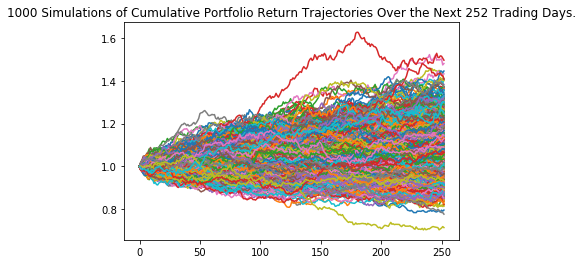

In [48]:
# Plot simulation outcomes
spagg_oneyr_line_plot = MC_spagg_one_year.plot_simulation()

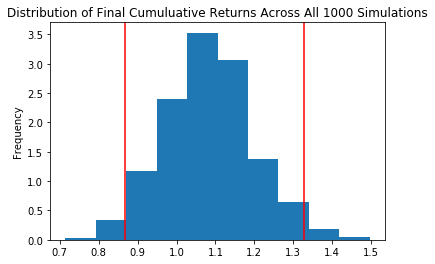

In [49]:
# Plot probability distribution and confidence intervals
spagg_oneyr_dist_plot = MC_spagg_one_year.plot_distribution()

In [50]:
# Fetch summary statistics from the Monte Carlo simulation results
spagg_oneyr_tbl = MC_spagg_one_year.summarize_cumulative_return()

# Print summary statistics
print(spagg_oneyr_tbl)

count           1000.000000
mean               1.083796
std                0.116378
min                0.714512
25%                1.003739
50%                1.082928
75%                1.154984
max                1.496470
95% CI Lower       0.866722
95% CI Upper       1.327272
Name: 252, dtype: float64


In [51]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_spaggone = round(spagg_oneyr_tbl[8],2)
ci_mean_spaggone = round(spagg_oneyr_tbl[1],2)
ci_upper_spaggone = round(spagg_oneyr_tbl[9],2)

print(ci_lower_spaggone, ci_mean_spaggone, ci_upper_spaggone)

0.87 1.08 1.33


In [52]:
# Configuring a Monte Carlo simulation to forecast 5 years cumulative returns
MC_spagg_five_year = MCSimulation(
    portfolio_data = spagg_close,
    weights = [0.40, 0.60],
    num_simulation = 1000,
    num_trading_days = 252 * 5
)

In [53]:
# Printing the simulation input data
MC_spagg_five_year.portfolio_data.head()

AGG                                                  \
            Adj Close       Close        High         Low        Open   
2011-07-11  83.650497  107.410004  107.540001  107.250000  107.339996   
2011-07-12  83.720619  107.500000  107.610001  107.330002  107.510002   
2011-07-13  83.884132  107.709999  107.720001  107.400002  107.430000   
2011-07-14  83.673859  107.440002  107.709999  107.419998  107.570000   
2011-07-15  83.790688  107.589996  107.690002  107.320000  107.389999   

                                           SPY                          \
               Volume daily_return   Adj Close       Close        High   
2011-07-11   615000.0          NaN  108.448463  131.970001  133.179993   
2011-07-12   681500.0     0.000838  107.980072  131.399994  132.779999   
2011-07-13   508400.0     0.001953  108.341629  131.839996  133.220001   
2011-07-14  1724900.0    -0.002507  107.593842  130.929993  132.779999   
2011-07-15   638300.0     0.001396  108.218399  131.690002  131.869995   

                                                              
                   Low        Open       Volume daily_return  
2011-07-11  131.660004  132.750000  195918600.0          NaN  
2011-07-12  131.360001  131.690002  214675700.0    -0.004319  
2011-07-13  131.520004  132.089996  204062600.0     0.003349  
2011-07-14  130.679993  132.169998  226111800.0    -0.006902  
2011-07-15  130.770004  131.660004  220012800.0     0.005805

In [54]:
# Running a Monte Carlo simulation to forecast 5 year cumulative returns
MC_spagg_five_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.993095,1.006585,1.000663,0.997507,0.996462,1.009967,1.014954,0.994601,0.990116,1.005456,...,0.995261,1.002675,1.003550,0.994045,1.000091,0.992842,0.996029,1.020676,1.006004,1.001854
2,0.997947,1.004527,1.003540,0.988532,0.995327,0.999012,1.012089,0.989254,0.988998,1.005737,...,0.992780,1.005191,1.006096,0.986296,1.000773,0.993889,0.999316,1.019020,1.008199,0.997380
3,1.012182,0.993585,0.987933,0.986139,0.993269,1.000176,1.022001,0.991871,0.981468,1.005513,...,1.004989,1.005198,1.011316,0.984498,0.999456,0.989942,1.000635,1.016371,1.010567,0.998913
4,1.020961,0.979942,0.997531,0.984191,0.995052,1.011384,1.028343,1.004352,0.995228,1.012257,...,1.011414,1.002953,1.008703,0.984656,1.008333,0.988415,1.003485,1.015142,1.006532,1.001612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,2.003416,1.171725,1.276498,1.253283,1.554350,1.668463,1.768904,1.538553,1.462672,1.257610,...,1.123918,1.833546,1.388472,1.635491,1.541051,1.467983,1.674819,1.692878,1.145980,2.615873
1257,2.002616,1.174211,1.274903,1.260943,1.549581,1.646452,1.752088,1.549002,1.469351,1.267358,...,1.127246,1.825461,1.379330,1.640006,1.548533,1.467490,1.663435,1.680170,1.140667,2.606311
1258,2.003441,1.175155,1.284969,1.254593,1.553934,1.643171,1.759005,1.553061,1.477834,1.277770,...,1.125692,1.810627,1.386532,1.628144,1.551384,1.460936,1.662009,1.675913,1.152405,2.616683
1259,2.002205,1.187030,1.274369,1.260265,1.543169,1.653439,1.758743,1.521608,1.461374,1.278730,...,1.130970,1.807106,1.396637,1.644963,1.535076,1.468422,1.672209,1.666567,1.164208,2.628021


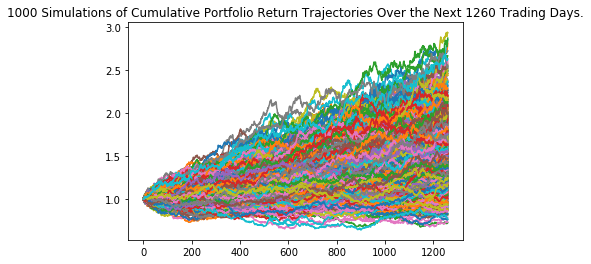

In [55]:
# Plot simulation outcomes
spagg_fiveyr_line_plot = MC_spagg_five_year.plot_simulation()

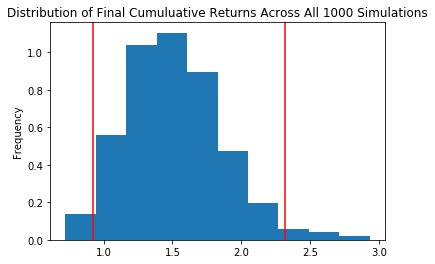

In [56]:
# Plot probability distribution and confidence intervals
spagg_fiveyr_dist_plot = MC_spagg_five_year.plot_distribution()

In [57]:
# Fetch summary statistics from the Monte Carlo simulation results
spagg_fiveyr_tbl = MC_spagg_five_year.summarize_cumulative_return()

# Print summary statistics
print(spagg_fiveyr_tbl)

count           1000.000000
mean               1.518504
std                0.352695
min                0.722943
25%                1.267729
50%                1.495730
75%                1.734336
max                2.931603
95% CI Lower       0.926045
95% CI Upper       2.315825
Name: 1260, dtype: float64


In [58]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_spaggfive = round(spagg_fiveyr_tbl[8],2)
ci_mean_spaggfive = round(spagg_fiveyr_tbl[1],2)
ci_upper_spaggfive = round(spagg_fiveyr_tbl[9],2)

print(ci_lower_spaggfive, ci_mean_spaggfive, ci_upper_spaggfive)

0.93 1.52 2.32


In [59]:
# Configuring a Monte Carlo simulation to forecast 1 year cumulative returns
MC_spy_one_year = MCSimulation(
    portfolio_data = spagg_close,
    weights = [0, 1],
    num_simulation = 1000,
    num_trading_days = 252 * 1
)

In [60]:
# Printing the simulation input data
MC_spy_one_year.portfolio_data.head()

AGG                                                  \
            Adj Close       Close        High         Low        Open   
2011-07-11  83.650497  107.410004  107.540001  107.250000  107.339996   
2011-07-12  83.720619  107.500000  107.610001  107.330002  107.510002   
2011-07-13  83.884132  107.709999  107.720001  107.400002  107.430000   
2011-07-14  83.673859  107.440002  107.709999  107.419998  107.570000   
2011-07-15  83.790688  107.589996  107.690002  107.320000  107.389999   

                                           SPY                          \
               Volume daily_return   Adj Close       Close        High   
2011-07-11   615000.0          NaN  108.448463  131.970001  133.179993   
2011-07-12   681500.0     0.000838  107.980072  131.399994  132.779999   
2011-07-13   508400.0     0.001953  108.341629  131.839996  133.220001   
2011-07-14  1724900.0    -0.002507  107.593842  130.929993  132.779999   
2011-07-15   638300.0     0.001396  108.218399  131.690002  131.869995   

                                                              
                   Low        Open       Volume daily_return  
2011-07-11  131.660004  132.750000  195918600.0          NaN  
2011-07-12  131.360001  131.690002  214675700.0    -0.004319  
2011-07-13  131.520004  132.089996  204062600.0     0.003349  
2011-07-14  130.679993  132.169998  226111800.0    -0.006902  
2011-07-15  130.770004  131.660004  220012800.0     0.005805

In [61]:
# Running a Monte Carlo simulation to forecast 1 year cumulative returns
MC_spy_one_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.011064,0.997286,0.998098,0.974811,1.011949,0.989510,0.994003,1.006918,0.997485,1.017070,...,0.991107,1.001082,0.986362,0.995648,0.993803,1.029892,0.975222,1.000909,1.017869,1.000352
2,1.017152,0.987158,0.992974,0.953162,1.005620,0.982047,0.969590,1.005166,0.987478,1.005899,...,1.006564,1.023579,0.995467,0.983008,0.998635,1.030334,0.965221,0.998663,1.018428,1.009647
3,1.037338,0.980312,1.001596,0.959274,1.011721,1.000702,0.968032,0.997745,0.993163,1.001551,...,1.007199,1.028409,0.987280,1.003652,0.986158,1.027338,0.946226,1.003783,1.022743,1.041213
4,1.036425,0.978686,0.995943,0.962642,1.018349,1.008575,0.979382,0.998760,0.993287,0.993507,...,1.021156,1.010305,0.996422,1.004536,0.994250,1.036275,0.943299,0.996092,1.035606,1.061349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,0.995534,1.263977,0.991259,1.056390,1.089402,0.900274,1.277513,0.897937,1.222447,1.115306,...,1.070624,1.167214,1.164283,1.279281,1.287008,1.402420,1.169065,1.195709,1.365083,1.182009
249,1.014784,1.249524,0.976388,1.046098,1.080863,0.915089,1.285383,0.907910,1.230762,1.121525,...,1.069210,1.170719,1.164022,1.312716,1.294806,1.379189,1.184088,1.212933,1.369197,1.186155
250,1.006594,1.230737,0.960571,1.060105,1.077152,0.902845,1.278797,0.892762,1.240032,1.120835,...,1.079442,1.175968,1.165772,1.308334,1.292594,1.357917,1.202375,1.219972,1.382166,1.164386
251,1.023755,1.251084,0.948895,1.053755,1.070148,0.900718,1.287060,0.883432,1.236978,1.113653,...,1.071408,1.174806,1.160277,1.315926,1.294768,1.356321,1.205679,1.192766,1.379660,1.155360


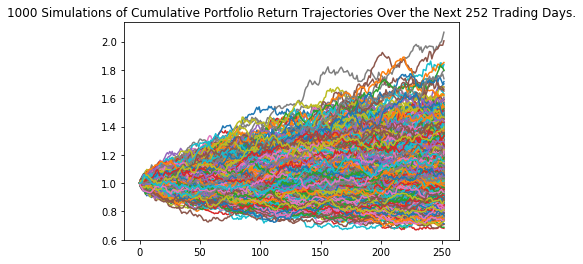

In [62]:
# Plot simulation outcomes
spy_oneyr_line_plot = MC_spy_one_year.plot_simulation()

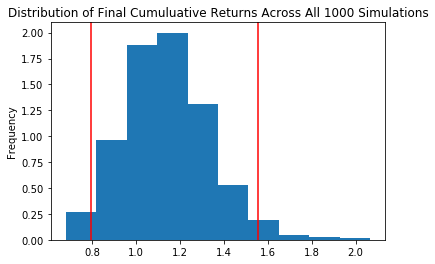

In [63]:
# Plot probability distribution and confidence intervals
spy_oneyr_dist_plot = MC_spy_one_year.plot_distribution()

In [64]:
# Fetch summary statistics from the Monte Carlo simulation results
spy_oneyr_tbl = MC_spy_one_year.summarize_cumulative_return()

# Print summary statistics
print(spy_oneyr_tbl)

count           1000.000000
mean               1.140462
std                0.197317
min                0.680647
25%                1.005864
50%                1.127545
75%                1.263688
max                2.066039
95% CI Lower       0.793286
95% CI Upper       1.555189
Name: 252, dtype: float64


In [65]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_spyone = round(spy_oneyr_tbl[8],2)
ci_mean_spyone = round(spy_oneyr_tbl[1],2)
ci_upper_spyone = round(spy_oneyr_tbl[9],2)

print(ci_lower_spyone, ci_mean_spyone, ci_upper_spyone)

0.79 1.14 1.56


In [66]:
# Configuring a Monte Carlo simulation to forecast 5 years cumulative returns
MC_spy_five_year = MCSimulation(
    portfolio_data = spagg_close,
    weights = [0.40, 0.60],
    num_simulation = 1000,
    num_trading_days = 252 * 5
)

In [67]:
# Printing the simulation input data
MC_spy_five_year.portfolio_data.head()

AGG                                                  \
            Adj Close       Close        High         Low        Open   
2011-07-11  83.650497  107.410004  107.540001  107.250000  107.339996   
2011-07-12  83.720619  107.500000  107.610001  107.330002  107.510002   
2011-07-13  83.884132  107.709999  107.720001  107.400002  107.430000   
2011-07-14  83.673859  107.440002  107.709999  107.419998  107.570000   
2011-07-15  83.790688  107.589996  107.690002  107.320000  107.389999   

                                           SPY                          \
               Volume daily_return   Adj Close       Close        High   
2011-07-11   615000.0          NaN  108.448463  131.970001  133.179993   
2011-07-12   681500.0     0.000838  107.980072  131.399994  132.779999   
2011-07-13   508400.0     0.001953  108.341629  131.839996  133.220001   
2011-07-14  1724900.0    -0.002507  107.593842  130.929993  132.779999   
2011-07-15   638300.0     0.001396  108.218399  131.690002  131.869995   

                                                              
                   Low        Open       Volume daily_return  
2011-07-11  131.660004  132.750000  195918600.0          NaN  
2011-07-12  131.360001  131.690002  214675700.0    -0.004319  
2011-07-13  131.520004  132.089996  204062600.0     0.003349  
2011-07-14  130.679993  132.169998  226111800.0    -0.006902  
2011-07-15  130.770004  131.660004  220012800.0     0.005805

In [68]:
# Running a Monte Carlo simulation to forecast 5 year cumulative returns
MC_spy_five_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.000560,0.986319,0.992015,0.999472,1.000103,1.009387,1.004711,0.989761,1.001380,1.000700,...,0.991528,1.007409,1.004811,0.999821,1.012480,1.003280,1.002881,1.004597,1.003034,0.999903
2,1.000964,0.991249,1.003624,0.995149,1.002020,1.019500,1.010363,0.992168,0.993620,1.013092,...,0.983791,1.013080,1.015470,0.997239,1.026493,0.997249,1.008738,1.007003,1.004328,0.997294
3,1.001695,0.991128,1.006541,0.991276,1.011946,1.018644,1.005428,0.981397,1.008075,1.004365,...,0.986404,1.015123,1.011378,0.997404,1.025559,0.992971,1.009676,1.006307,1.007641,0.994243
4,0.993822,0.987571,1.007667,0.999583,1.006800,1.017763,1.001018,0.976062,1.008870,1.017826,...,0.991033,1.019431,1.017490,1.007354,1.031003,0.990701,1.012960,1.001489,1.015670,0.986966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,1.212385,0.984256,1.436106,0.980379,1.997701,1.638695,0.778273,1.220499,1.853313,1.832967,...,1.815961,1.600788,1.582162,1.355932,2.637132,2.259087,1.598902,1.213361,2.127897,0.994352
1257,1.215157,0.994604,1.438841,0.986307,1.988238,1.633278,0.775149,1.211705,1.841132,1.833578,...,1.795783,1.598629,1.588074,1.355752,2.632509,2.255646,1.619508,1.202910,2.121838,0.993134
1258,1.221312,0.991724,1.437045,0.987258,1.986185,1.613683,0.775226,1.220192,1.852900,1.825505,...,1.805941,1.617980,1.588801,1.365286,2.624609,2.239066,1.607558,1.199707,2.128581,0.989725
1259,1.221352,0.999246,1.433514,0.991831,1.993559,1.604011,0.775891,1.216858,1.867034,1.853484,...,1.788699,1.595601,1.566218,1.365249,2.619237,2.244448,1.615543,1.205444,2.134577,0.992320


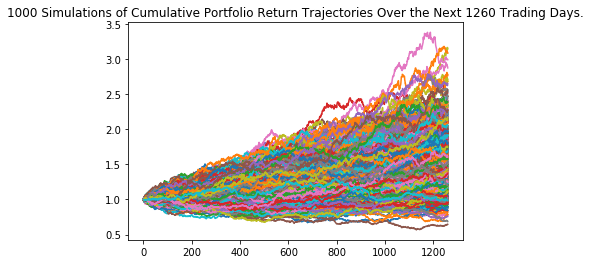

In [69]:
# Plot simulation outcomes
spy_fiveyr_line_plot = MC_spy_five_year.plot_simulation()

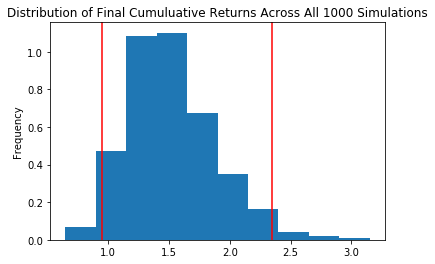

In [70]:
# Plot probability distribution and confidence intervals
spy_fiveyr_dist_plot = MC_spy_five_year.plot_distribution()

In [71]:
# Fetch summary statistics from the Monte Carlo simulation results
spy_fiveyr_tbl = MC_spy_five_year.summarize_cumulative_return()

# Print summary statistics
print(spy_fiveyr_tbl)

count           1000.000000
mean               1.522042
std                0.365558
min                0.646776
25%                1.261186
50%                1.475436
75%                1.743186
max                3.151509
95% CI Lower       0.951660
95% CI Upper       2.344924
Name: 1260, dtype: float64


In [72]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_spyfive = round(spy_fiveyr_tbl[8],2)
ci_mean_spyfive = round(spy_fiveyr_tbl[1],2)
ci_upper_spyfive = round(spy_fiveyr_tbl[9],2)

print(ci_lower_spyfive, ci_mean_spyfive, ci_upper_spyfive)

0.95 1.52 2.34


In [73]:
# QQQ and Russell 2000 Data for comparisons to either the Nasdaq or Russell 2000 indexes
qqqrutStrings = ['QQQ', '^RUT']

qqqrut_close = yf.download(qqqrutStrings, group_by='Ticker', period='10y')

# Create CSV of ticker data
qqqrut_close.to_csv('qqqrut.csv')

qqqrut_close = qqqrut_close.stack(level=0).rename_axis(['Date', 'Ticker']).reset_index(level=1)

qqqrut_close = pd.read_csv('qqqrut.csv', header=[0, 1])
qqqrut_close.drop([0], axis=0, inplace=True)  # drop this row because it only has one column with Date in it
qqqrut_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')] = pd.to_datetime(qqqrut_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')], format='%Y-%m-%d')  # convert the first column to a datetime
qqqrut_close.set_index(('Unnamed: 0_level_0', 'Unnamed: 0_level_1'), inplace=True)  # set the first column as the index
qqqrut_close.index.name = None

# Drop Null Information
qqqrut_close = qqqrut_close.dropna()

# Sort Multi-Index To Match Weights
qqqrut_close = qqqrut_close.reindex(sorted(qqqrut_close.columns), axis=1)

qqqrut_close

[*********************100%***********************]  2 of 2 completed


QQQ                                                  \
             Adj Close       Close        High         Low        Open   
2011-07-11   52.451885   57.959999   58.709999   57.759998   58.410000   
2011-07-12   52.053707   57.520000   58.070000   57.459999   57.950001   
2011-07-13   52.270912   57.759998   58.340000   57.549999   57.939999   
2011-07-14   51.664581   57.090000   58.180000   56.869999   57.910000   
2011-07-15   52.352352   57.849998   57.849998   57.310001   57.730000   
...                ...         ...         ...         ...         ...   
2021-07-01  354.570007  354.570007  355.089996  352.679993  354.070007   
2021-07-02  358.640015  358.640015  358.970001  356.279999  356.519989   
2021-07-06  360.190002  360.190002  360.480011  356.489990  359.260010   
2021-07-07  360.950012  360.950012  362.760010  358.940002  362.450012   
2021-07-08  358.769989  358.769989  359.640015  354.420013  355.739990   

                               ^RUT                                         \
                Volume    Adj Close        Close         High          Low   
2011-07-11  52080800.0   833.539978   833.539978   845.380005   832.179993   
2011-07-12  84000700.0   829.770020   829.770020   838.070007   829.289978   
2011-07-13  82378100.0   836.979980   836.979980   845.140015   833.799988   
2011-07-14  98774200.0   823.320007   823.320007   841.340027   821.950012   
2011-07-15  68281500.0   828.780029   828.780029   829.090027   823.520020   
...                ...          ...          ...          ...          ...   
2021-07-01  29290000.0  2329.360107  2329.360107  2332.280029  2312.570068   
2021-07-02  32715600.0  2305.760010  2305.760010  2332.949951  2302.939941   
2021-07-06  38842400.0  2274.500000  2274.500000  2306.909912  2256.969971   
2021-07-07  35207900.0  2252.850098  2252.850098  2278.100098  2235.500000   
2021-07-08  50890021.0  2231.677002  2231.677002  2252.724121  2192.978516   

                                       
                   Open        Volume  
2011-07-11   844.609985  3.879130e+09  
2011-07-12   830.419983  4.227890e+09  
2011-07-13   834.229980  4.060080e+09  
2011-07-14   838.669983  4.358570e+09  
2011-07-15   825.580017  4.242760e+09  
...                 ...           ...  
2021-07-01  2312.570068  3.077580e+09  
2021-07-02  2328.530029  2.628550e+09  
2021-07-06  2305.959961  3.437900e+09  
2021-07-07  2274.530029  3.243900e+09  
2021-07-08  2249.943604  0.000000e+00  

[2516 rows x 12 columns]

In [74]:
# Configuring a Monte Carlo simulation to forecast 1 year cumulative returns
MC_qqq_one_year = MCSimulation(
    portfolio_data = qqqrut_close,
    weights = [1, 0],
    num_simulation = 1000,
    num_trading_days = 252 * 1
)

In [75]:
# Printing the simulation input data
MC_qqq_one_year.portfolio_data.head()

QQQ                                                          \
            Adj Close      Close       High        Low       Open      Volume   
2011-07-11  52.451885  57.959999  58.709999  57.759998  58.410000  52080800.0   
2011-07-12  52.053707  57.520000  58.070000  57.459999  57.950001  84000700.0   
2011-07-13  52.270912  57.759998  58.340000  57.549999  57.939999  82378100.0   
2011-07-14  51.664581  57.090000  58.180000  56.869999  57.910000  98774200.0   
2011-07-15  52.352352  57.849998  57.849998  57.310001  57.730000  68281500.0   

                               ^RUT                                      \
           daily_return   Adj Close       Close        High         Low   
2011-07-11          NaN  833.539978  833.539978  845.380005  832.179993   
2011-07-12    -0.007591  829.770020  829.770020  838.070007  829.289978   
2011-07-13     0.004172  836.979980  836.979980  845.140015  833.799988   
2011-07-14    -0.011600  823.320007  823.320007  841.340027  821.950012   
2011-07-15     0.013312  828.780029  828.780029  829.090027  823.520020   

                                                   
                  Open        Volume daily_return  
2011-07-11  844.609985  3.879130e+09          NaN  
2011-07-12  830.419983  4.227890e+09    -0.004523  
2011-07-13  834.229980  4.060080e+09     0.008689  
2011-07-14  838.669983  4.358570e+09    -0.016321  
2011-07-15  825.580017  4.242760e+09     0.006632

In [76]:
# Running a Monte Carlo simulation to forecast 1 year cumulative returns
MC_qqq_one_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.010232,1.012885,1.014795,1.017575,0.996016,1.002636,1.001773,1.005035,0.993019,1.001714,...,0.996381,0.975550,0.982320,1.011531,1.002916,1.004062,0.994214,0.990780,1.032625,0.991485
2,1.015117,0.991035,1.012549,1.034480,0.982660,1.010491,1.008938,1.016899,0.972546,1.015231,...,1.020714,0.974820,0.997393,1.024664,1.001421,0.996666,0.994507,0.982844,1.019485,0.984778
3,1.028220,0.990203,1.021166,1.035232,0.976885,0.996806,1.018004,1.012467,0.974328,1.018317,...,1.032659,0.962104,1.003949,1.026817,0.999773,1.013099,0.997284,0.990227,1.005685,0.981481
4,1.021301,0.988542,1.004325,1.044941,0.968078,1.008248,1.032640,1.009596,0.965998,1.043518,...,1.029152,0.974591,1.001594,1.021425,1.002944,1.037400,1.001901,1.003860,0.985674,0.972476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.114746,1.188148,1.017048,1.380037,1.250937,1.223750,1.218481,1.100270,1.667474,1.513870,...,1.326187,1.126053,0.828866,1.708590,1.513548,1.165309,1.116061,1.723604,1.201843,0.978178
249,1.119324,1.158666,1.039031,1.361802,1.258244,1.222798,1.223437,1.091002,1.652111,1.502728,...,1.350752,1.129091,0.832481,1.696300,1.508403,1.156867,1.094592,1.707391,1.194954,0.957296
250,1.099370,1.160049,1.034900,1.352007,1.283827,1.199064,1.250267,1.117467,1.657116,1.495937,...,1.371569,1.128365,0.841069,1.679193,1.517143,1.144544,1.080860,1.685398,1.213921,0.987190
251,1.075599,1.151286,1.051128,1.327214,1.320808,1.203354,1.232051,1.123220,1.676103,1.537822,...,1.387449,1.115698,0.828234,1.682062,1.517709,1.115241,1.100609,1.685820,1.205978,0.989005


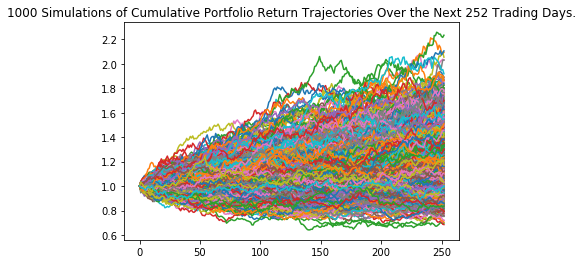

In [77]:
# Plot simulation outcomes
qqq_oneyr_line_plot = MC_qqq_one_year.plot_simulation()

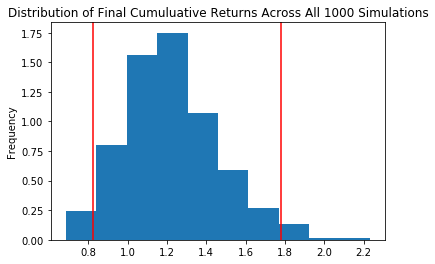

In [78]:
# Plot probability distribution and confidence intervals
qqq_oneyr_dist_plot = MC_qqq_one_year.plot_distribution()

In [79]:
# Fetch summary statistics from the Monte Carlo simulation results
qqq_oneyr_tbl = MC_qqq_one_year.summarize_cumulative_return()

# Print summary statistics
print(qqq_oneyr_tbl)

count           1000.000000
mean               1.225891
std                0.240926
min                0.685180
25%                1.063390
50%                1.199659
75%                1.364818
max                2.233662
95% CI Lower       0.825089
95% CI Upper       1.778345
Name: 252, dtype: float64


In [80]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_qqqone = round(qqq_oneyr_tbl[8],2)
ci_mean_qqqone = round(qqq_oneyr_tbl[1],2)
ci_upper_qqqone = round(qqq_oneyr_tbl[9],2)

print(ci_lower_qqqone, ci_mean_qqqone, ci_upper_qqqone)

0.83 1.23 1.78


In [81]:
# Configuring a Monte Carlo simulation to forecast 5 years cumulative returns
MC_qqq_five_year = MCSimulation(
    portfolio_data = qqqrut_close,
    weights = [1, 0],
    num_simulation = 1000,
    num_trading_days = 252 * 5
)

In [82]:
# Printing the simulation input data
MC_qqq_five_year.portfolio_data.head()

QQQ                                                          \
            Adj Close      Close       High        Low       Open      Volume   
2011-07-11  52.451885  57.959999  58.709999  57.759998  58.410000  52080800.0   
2011-07-12  52.053707  57.520000  58.070000  57.459999  57.950001  84000700.0   
2011-07-13  52.270912  57.759998  58.340000  57.549999  57.939999  82378100.0   
2011-07-14  51.664581  57.090000  58.180000  56.869999  57.910000  98774200.0   
2011-07-15  52.352352  57.849998  57.849998  57.310001  57.730000  68281500.0   

                               ^RUT                                      \
           daily_return   Adj Close       Close        High         Low   
2011-07-11          NaN  833.539978  833.539978  845.380005  832.179993   
2011-07-12    -0.007591  829.770020  829.770020  838.070007  829.289978   
2011-07-13     0.004172  836.979980  836.979980  845.140015  833.799988   
2011-07-14    -0.011600  823.320007  823.320007  841.340027  821.950012   
2011-07-15     0.013312  828.780029  828.780029  829.090027  823.520020   

                                                   
                  Open        Volume daily_return  
2011-07-11  844.609985  3.879130e+09          NaN  
2011-07-12  830.419983  4.227890e+09    -0.004523  
2011-07-13  834.229980  4.060080e+09     0.008689  
2011-07-14  838.669983  4.358570e+09    -0.016321  
2011-07-15  825.580017  4.242760e+09     0.006632

In [83]:
# Running a Monte Carlo simulation to forecast 5 year cumulative returns
MC_qqq_five_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.997938,1.011494,0.983371,0.984943,1.000056,0.988915,1.015754,1.003692,1.000081,1.000739,...,0.990498,0.970609,1.000227,0.988160,0.998789,0.991689,0.999442,0.984195,0.997089,0.989778
2,0.998352,1.005879,0.993543,0.994255,0.999181,0.970418,1.011823,1.013702,1.003510,1.013833,...,0.985254,0.975068,0.999235,0.971201,0.987046,0.977987,1.001029,0.991628,0.972642,0.992403
3,1.023475,0.987540,0.997400,0.995468,1.006765,0.969211,1.017318,1.018447,1.014469,1.008728,...,0.975983,0.983315,0.998992,0.976819,0.984637,1.005714,1.010434,0.987486,0.980600,1.007034
4,1.021723,0.976203,0.981703,1.005105,0.998717,0.979870,1.011379,1.013576,0.998843,1.025083,...,0.980814,0.988709,1.011270,0.976379,0.990021,0.993453,1.004691,0.994686,0.956929,1.003433
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,4.365568,3.021751,1.744675,1.539155,1.715003,3.002863,1.557555,5.297830,1.943804,3.382756,...,1.242291,2.725518,2.683578,2.395985,2.302151,3.261582,1.552857,3.305216,2.496701,1.805224
1257,4.361853,3.040994,1.761942,1.525007,1.710860,3.035500,1.543630,5.390724,1.927018,3.453348,...,1.214640,2.702786,2.676242,2.379524,2.287847,3.308923,1.563282,3.361146,2.482610,1.844582
1258,4.395473,3.033639,1.748914,1.500360,1.708642,3.030906,1.575310,5.410640,1.952302,3.449068,...,1.195201,2.706368,2.624323,2.451746,2.294840,3.358939,1.568645,3.351689,2.499409,1.849922
1259,4.355298,3.057046,1.746828,1.529537,1.720515,3.080291,1.616133,5.334365,1.943053,3.476772,...,1.173761,2.645308,2.644072,2.462717,2.317047,3.408545,1.596683,3.413522,2.464565,1.824463


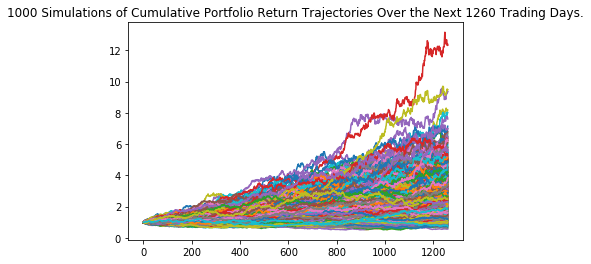

In [84]:
# Plot simulation outcomes
qqq_fiveyr_line_plot = MC_qqq_five_year.plot_simulation()

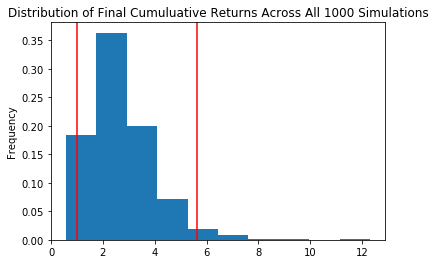

In [85]:
# Plot probability distribution and confidence intervals
qqq_fiveyr_dist_plot = MC_qqq_five_year.plot_distribution()

In [86]:
# Fetch summary statistics from the Monte Carlo simulation results
qqq_fiveyr_tbl = MC_qqq_five_year.summarize_cumulative_return()

# Print summary statistics
print(qqq_fiveyr_tbl)

count           1000.000000
mean               2.710246
std                1.255461
min                0.565791
25%                1.812123
50%                2.496706
75%                3.299953
max               12.320360
95% CI Lower       0.999147
95% CI Upper       5.634398
Name: 1260, dtype: float64


In [87]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_qqqfive = round(qqq_fiveyr_tbl[8],2)
ci_mean_qqqfive = round(qqq_fiveyr_tbl[1],2)
ci_upper_qqqfive = round(qqq_fiveyr_tbl[9],2)

print(ci_lower_qqqfive, ci_mean_qqqfive, ci_upper_qqqfive)

1.0 2.71 5.63


In [88]:
# Configuring a Monte Carlo simulation to forecast 1 year cumulative returns
MC_rut_one_year = MCSimulation(
    portfolio_data = qqqrut_close,
    weights = [0, 1],
    num_simulation = 1000,
    num_trading_days = 252 * 1
)

In [89]:
# Printing the simulation input data
MC_rut_one_year.portfolio_data.head()

QQQ                                                          \
            Adj Close      Close       High        Low       Open      Volume   
2011-07-11  52.451885  57.959999  58.709999  57.759998  58.410000  52080800.0   
2011-07-12  52.053707  57.520000  58.070000  57.459999  57.950001  84000700.0   
2011-07-13  52.270912  57.759998  58.340000  57.549999  57.939999  82378100.0   
2011-07-14  51.664581  57.090000  58.180000  56.869999  57.910000  98774200.0   
2011-07-15  52.352352  57.849998  57.849998  57.310001  57.730000  68281500.0   

                               ^RUT                                      \
           daily_return   Adj Close       Close        High         Low   
2011-07-11          NaN  833.539978  833.539978  845.380005  832.179993   
2011-07-12    -0.007591  829.770020  829.770020  838.070007  829.289978   
2011-07-13     0.004172  836.979980  836.979980  845.140015  833.799988   
2011-07-14    -0.011600  823.320007  823.320007  841.340027  821.950012   
2011-07-15     0.013312  828.780029  828.780029  829.090027  823.520020   

                                                   
                  Open        Volume daily_return  
2011-07-11  844.609985  3.879130e+09          NaN  
2011-07-12  830.419983  4.227890e+09    -0.004523  
2011-07-13  834.229980  4.060080e+09     0.008689  
2011-07-14  838.669983  4.358570e+09    -0.016321  
2011-07-15  825.580017  4.242760e+09     0.006632

In [90]:
# Running a Monte Carlo simulation to forecast 1 year cumulative returns
MC_rut_one_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.996087,1.004067,1.016948,1.007510,1.015190,0.991002,0.989963,1.012332,1.029218,1.004302,...,0.987981,0.990781,1.033987,0.991646,1.006281,1.004702,1.019067,1.007722,1.005288,1.000656
2,0.980809,0.979370,1.036416,1.016650,1.011212,0.977643,0.996794,0.992673,1.033472,0.975166,...,0.990977,0.999648,1.056082,0.983926,0.991618,1.008582,1.022269,1.006650,1.020475,1.007365
3,0.959918,0.988398,1.025680,1.023423,1.017307,0.987688,1.014226,0.994532,1.017106,0.995072,...,0.994465,1.005732,1.079507,0.962893,0.999499,0.998619,1.025589,0.977319,1.002773,0.987535
4,0.955396,0.981146,1.040868,1.020726,1.030288,0.983990,1.032352,1.016937,1.027619,1.013888,...,0.997469,1.018698,1.069576,0.969786,0.971002,0.980676,1.021392,0.981088,0.999850,1.002298
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,0.936777,0.996426,1.371235,1.977727,0.770350,1.096359,1.034347,0.813694,1.122187,1.159237,...,0.763225,1.018087,1.180381,1.725066,1.704181,1.527127,1.219996,1.261877,1.169462,1.177475
249,0.939634,0.987322,1.379552,1.989846,0.766534,1.104965,1.045886,0.819099,1.120527,1.156903,...,0.762104,1.062429,1.171302,1.718716,1.717331,1.497639,1.216398,1.270437,1.180679,1.153100
250,0.932975,0.985263,1.376609,1.943469,0.778803,1.129084,1.045056,0.797757,1.145140,1.152133,...,0.771590,1.064848,1.192176,1.719340,1.719357,1.490186,1.220876,1.290082,1.176130,1.152195
251,0.919483,0.966737,1.389531,1.951549,0.775982,1.129988,1.076791,0.792134,1.114336,1.123760,...,0.795872,1.072143,1.188269,1.724182,1.713950,1.504396,1.200917,1.278152,1.157610,1.160332


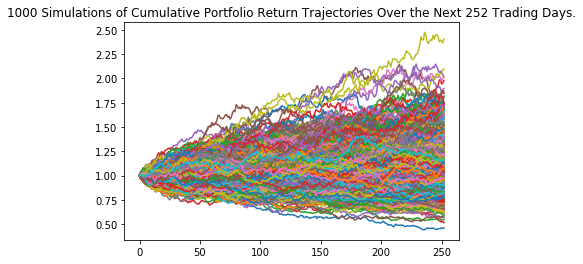

In [91]:
# Plot simulation outcomes
rut_oneyr_line_plot = MC_rut_one_year.plot_simulation()

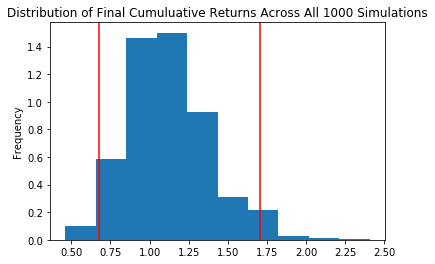

In [92]:
# Plot probability distribution and confidence intervals
rut_oneyr_dist_plot = MC_rut_one_year.plot_distribution()

In [93]:
# Fetch summary statistics from the Monte Carlo simulation results
rut_oneyr_tbl = MC_rut_one_year.summarize_cumulative_return()

# Print summary statistics
print(rut_oneyr_tbl)

count           1000.000000
mean               1.121176
std                0.258110
min                0.461742
25%                0.941189
50%                1.101325
75%                1.274126
max                2.408114
95% CI Lower       0.673974
95% CI Upper       1.703132
Name: 252, dtype: float64


In [94]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_rutone = round(rut_oneyr_tbl[8],2)
ci_mean_rutone = round(rut_oneyr_tbl[1],2)
ci_upper_rutone = round(rut_oneyr_tbl[9],2)

print(ci_lower_rutone, ci_mean_rutone, ci_upper_rutone)

0.67 1.12 1.7


In [95]:
# Configuring a Monte Carlo simulation to forecast 5 years cumulative returns
MC_rut_five_year = MCSimulation(
    portfolio_data = qqqrut_close,
    weights = [0, 1],
    num_simulation = 1000,
    num_trading_days = 252 * 5
)

In [96]:
# Printing the simulation input data
MC_rut_five_year.portfolio_data.head()

QQQ                                                          \
            Adj Close      Close       High        Low       Open      Volume   
2011-07-11  52.451885  57.959999  58.709999  57.759998  58.410000  52080800.0   
2011-07-12  52.053707  57.520000  58.070000  57.459999  57.950001  84000700.0   
2011-07-13  52.270912  57.759998  58.340000  57.549999  57.939999  82378100.0   
2011-07-14  51.664581  57.090000  58.180000  56.869999  57.910000  98774200.0   
2011-07-15  52.352352  57.849998  57.849998  57.310001  57.730000  68281500.0   

                               ^RUT                                      \
           daily_return   Adj Close       Close        High         Low   
2011-07-11          NaN  833.539978  833.539978  845.380005  832.179993   
2011-07-12    -0.007591  829.770020  829.770020  838.070007  829.289978   
2011-07-13     0.004172  836.979980  836.979980  845.140015  833.799988   
2011-07-14    -0.011600  823.320007  823.320007  841.340027  821.950012   
2011-07-15     0.013312  828.780029  828.780029  829.090027  823.520020   

                                                   
                  Open        Volume daily_return  
2011-07-11  844.609985  3.879130e+09          NaN  
2011-07-12  830.419983  4.227890e+09    -0.004523  
2011-07-13  834.229980  4.060080e+09     0.008689  
2011-07-14  838.669983  4.358570e+09    -0.016321  
2011-07-15  825.580017  4.242760e+09     0.006632

In [97]:
# Running a Monte Carlo simulation to forecast 5 year cumulative returns
MC_rut_five_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.021526,0.995179,0.988593,0.991159,1.005575,0.990904,1.004044,0.998295,0.997710,0.990316,...,1.016875,1.007413,0.962488,1.007557,0.981616,0.993815,0.998626,0.979127,1.024736,1.013254
2,1.030217,0.994540,1.004050,0.986594,1.021994,0.971944,0.987609,0.999957,0.987450,0.984812,...,1.023847,1.005164,0.974692,1.008155,0.987639,0.958079,1.031048,0.973636,1.027519,1.028144
3,0.998639,0.986655,1.007293,0.994072,1.032418,0.983589,0.985086,0.986995,1.005401,0.979723,...,1.024920,1.018517,0.957785,1.005882,0.967608,0.970881,1.018584,0.996113,1.023961,1.021505
4,1.003097,0.994430,1.019979,1.004654,1.061087,0.976072,0.941188,0.981753,0.986039,0.970143,...,1.021814,1.024527,0.947518,0.980414,0.979181,0.972732,0.987835,0.985057,1.003118,1.001795
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,2.949933,0.667928,1.085086,2.373558,2.330276,2.218348,0.755465,3.468072,1.815365,1.177709,...,0.833187,2.553935,2.502738,0.968151,2.418396,1.052219,1.856515,2.624704,0.871880,3.635240
1257,2.984574,0.679455,1.056568,2.359319,2.327005,2.170381,0.749386,3.446636,1.812257,1.179362,...,0.841948,2.553720,2.524527,0.954028,2.462383,1.055449,1.851549,2.635816,0.862368,3.602187
1258,2.999030,0.681012,1.049393,2.325007,2.343221,2.190875,0.728743,3.483966,1.799655,1.206606,...,0.842491,2.573639,2.525715,0.950524,2.479793,1.074173,1.828957,2.592654,0.870763,3.643550
1259,2.950934,0.701041,1.043083,2.281263,2.363452,2.154281,0.727813,3.493195,1.803020,1.203095,...,0.816700,2.646565,2.516750,0.944372,2.514278,1.086913,1.798440,2.549654,0.861474,3.664069


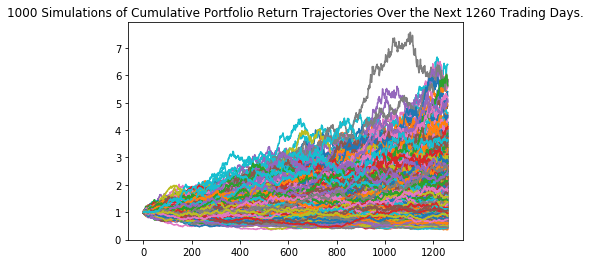

In [98]:
# Plot simulation outcomes
rut_fiveyr_line_plot = MC_rut_five_year.plot_simulation()

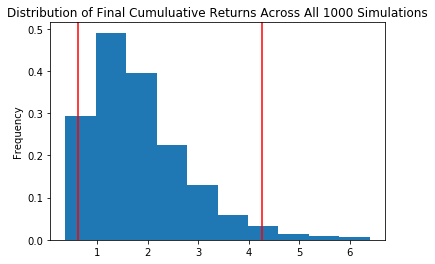

In [99]:
# Plot probability distribution and confidence intervals
rut_fiveyr_dist_plot = MC_rut_five_year.plot_distribution()

In [100]:
# Fetch summary statistics from the Monte Carlo simulation results
rut_fiveyr_tbl = MC_rut_five_year.summarize_cumulative_return()

# Print summary statistics
print(rut_fiveyr_tbl)

count           1000.000000
mean               1.839684
std                0.969638
min                0.365823
25%                1.133675
50%                1.647982
75%                2.295199
max                6.401161
95% CI Lower       0.612003
95% CI Upper       4.257003
Name: 1260, dtype: float64


In [101]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_rutfive = round(rut_fiveyr_tbl[8],2)
ci_mean_rutfive = round(rut_fiveyr_tbl[1],2)
ci_upper_rutfive = round(rut_fiveyr_tbl[9],2)

print(ci_lower_rutfive, ci_mean_rutfive, ci_upper_rutfive)

0.61 1.84 4.26


In [102]:
# AAPL and TSLA Data for comparisons to either the Nasdaq or S&P 500 indexes
aapltslaStrings = ['AAPL', 'TSLA']

aapltsla_close = yf.download(aapltslaStrings, group_by='Ticker', period='10y')

# Create CSV of ticker data
aapltsla_close.to_csv('aapltsla.csv')

aapltsla_close = aapltsla_close.stack(level=0).rename_axis(['Date', 'Ticker']).reset_index(level=1)

aapltsla_close = pd.read_csv('aapltsla.csv', header=[0, 1])
aapltsla_close.drop([0], axis=0, inplace=True)  # drop this row because it only has one column with Date in it
aapltsla_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')] = pd.to_datetime(aapltsla_close[('Unnamed: 0_level_0', 'Unnamed: 0_level_1')], format='%Y-%m-%d')  # convert the first column to a datetime
aapltsla_close.set_index(('Unnamed: 0_level_0', 'Unnamed: 0_level_1'), inplace=True)  # set the first column as the index
aapltsla_close.index.name = None

# Drop Null Information
aapltsla_close = aapltsla_close.dropna()

# Sort Multi-Index To Match Weights
aapltsla_close = aapltsla_close.reindex(sorted(aapltsla_close.columns), axis=1)

aapltsla_close

[*********************100%***********************]  2 of 2 completed


AAPL                                                  \
             Adj Close       Close        High         Low        Open   
2011-07-11   10.871630   12.642857   12.848929   12.600714   12.726429   
2011-07-12   10.863953   12.633929   12.774286   12.450714   12.626071   
2011-07-13   10.995090   12.786429   12.857143   12.727857   12.797500   
2011-07-14   10.987410   12.777500   12.914643   12.726429   12.893214   
2011-07-15   11.206989   13.032857   13.035714   12.827500   12.898929   
...                ...         ...         ...         ...         ...   
2021-07-01  137.270004  137.270004  137.330002  135.759995  136.600006   
2021-07-02  139.960007  139.960007  140.000000  137.750000  137.899994   
2021-07-06  142.020004  142.020004  143.149994  140.070007  140.070007   
2021-07-07  144.570007  144.570007  144.889999  142.660004  143.539993   
2021-07-08  143.240005  143.240005  144.059998  140.669998  141.580002   

                               TSLA                                      \
                 Volume   Adj Close       Close        High         Low   
2011-07-11  442674400.0    5.670000    5.670000    5.706000    5.600000   
2011-07-12  451609200.0    5.634000    5.634000    5.818000    5.600000   
2011-07-13  391638800.0    5.728000    5.728000    5.806000    5.580000   
2011-07-14  430533600.0    5.522000    5.522000    5.792000    5.450000   
2011-07-15  484467200.0    5.516000    5.516000    5.566000    5.480000   
...                 ...         ...         ...         ...         ...   
2021-07-01   52485800.0  677.919983  677.919983  687.989990  672.799988   
2021-07-02   78852600.0  678.900024  678.900024  700.000000  673.260010   
2021-07-06  108181800.0  659.580017  659.580017  684.000000  651.400024   
2021-07-07  104738600.0  644.650024  644.650024  665.700012  638.320007   
2021-07-08  103561917.0  652.809998  652.809998  654.429993  620.460022   

                                    
                  Open      Volume  
2011-07-11    5.680000   4879000.0  
2011-07-12    5.674000   5227000.0  
2011-07-13    5.686000   5330000.0  
2011-07-14    5.706000   5795000.0  
2011-07-15    5.558000   3545000.0  
...                ...         ...  
2021-07-01  683.919983  18634500.0  
2021-07-02  678.979980  27054500.0  
2021-07-06  681.710022  23284500.0  
2021-07-07  664.270020  18750300.0  
2021-07-08  628.369995  22773316.0  

[2516 rows x 12 columns]

In [103]:
# Configuring a Monte Carlo simulation to forecast 1 year cumulative returns
MC_aapl_one_year = MCSimulation(
    portfolio_data = aapltsla_close,
    weights = [1, 0],
    num_simulation = 1000,
    num_trading_days = 252 * 1
)

In [104]:
# Printing the simulation input data
MC_aapl_one_year.portfolio_data.head()

AAPL                                              \
            Adj Close      Close       High        Low       Open   
2011-07-11  10.871630  12.642857  12.848929  12.600714  12.726429   
2011-07-12  10.863953  12.633929  12.774286  12.450714  12.626071   
2011-07-13  10.995090  12.786429  12.857143  12.727857  12.797500   
2011-07-14  10.987410  12.777500  12.914643  12.726429  12.893214   
2011-07-15  11.206989  13.032857  13.035714  12.827500  12.898929   

                                          TSLA                             \
                 Volume daily_return Adj Close  Close   High   Low   Open   
2011-07-11  442674400.0          NaN     5.670  5.670  5.706  5.60  5.680   
2011-07-12  451609200.0    -0.000706     5.634  5.634  5.818  5.60  5.674   
2011-07-13  391638800.0     0.012071     5.728  5.728  5.806  5.58  5.686   
2011-07-14  430533600.0    -0.000698     5.522  5.522  5.792  5.45  5.706   
2011-07-15  484467200.0     0.019985     5.516  5.516  5.566  5.48  5.558   

                                    
               Volume daily_return  
2011-07-11  4879000.0          NaN  
2011-07-12  5227000.0    -0.006349  
2011-07-13  5330000.0     0.016684  
2011-07-14  5795000.0    -0.035964  
2011-07-15  3545000.0    -0.001087

In [105]:
# Running a Monte Carlo simulation to forecast 1 year cumulative returns
MC_aapl_one_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.025317,0.996034,1.002518,0.988322,1.010701,0.992379,0.967167,0.992771,0.991116,0.990988,...,0.996591,1.028958,0.960951,0.995008,0.988723,0.989523,1.001298,1.025278,1.017804,0.997933
2,1.023044,0.958675,0.992273,0.981782,0.993083,0.993589,0.987395,0.983595,1.024031,1.016810,...,1.005377,1.044476,0.934788,1.023755,0.963722,0.997744,0.993951,1.025847,1.051343,1.006848
3,1.028383,0.974779,1.015246,0.966349,0.997045,0.952120,0.990713,0.982871,1.038427,1.026015,...,0.984008,1.051763,0.934697,1.030195,0.978590,1.006299,1.008912,1.033204,1.072722,0.996374
4,1.022566,0.963101,1.030200,0.985524,0.978066,0.967438,0.941288,0.955854,1.045208,1.014574,...,0.992168,1.049545,0.924825,1.031083,0.984352,1.007893,0.997127,1.029961,1.074854,0.992543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.245074,0.925711,0.746665,0.987716,2.029811,2.763588,1.153017,1.931905,1.228731,0.765941,...,1.660607,1.466831,1.171838,0.908150,1.703890,1.080239,1.451082,0.921533,1.092868,0.990369
249,1.257709,0.921976,0.736449,1.024294,2.023643,2.804084,1.148628,1.926465,1.270473,0.756551,...,1.686196,1.515343,1.166180,0.902003,1.665965,1.091846,1.437858,0.921948,1.091356,1.000340
250,1.258666,0.916462,0.734210,1.043801,2.035370,2.876622,1.161482,1.953974,1.307317,0.749255,...,1.647243,1.508342,1.220846,0.883131,1.671295,1.085550,1.424558,0.917462,1.107477,1.010533
251,1.261573,0.929730,0.742342,1.083243,2.054503,2.869584,1.159866,1.975463,1.291353,0.767470,...,1.659360,1.527293,1.227212,0.881950,1.673534,1.073368,1.485072,0.904004,1.109031,1.013614


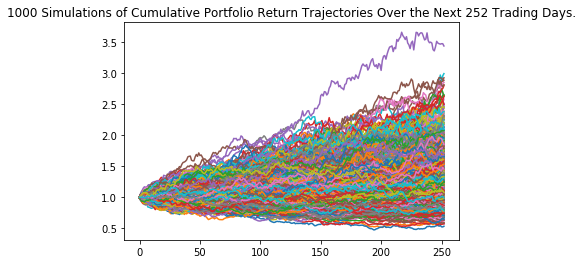

In [106]:
# Plot simulation outcomes
aapl_oneyr_line_plot = MC_aapl_one_year.plot_simulation()

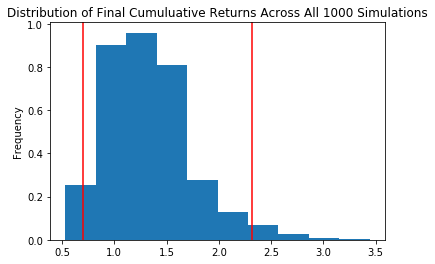

In [107]:
# Plot probability distribution and confidence intervals
aapl_oneyr_dist_plot = MC_aapl_one_year.plot_distribution()

In [108]:
# Fetch summary statistics from the Monte Carlo simulation results
aapl_oneyr_tbl = MC_aapl_one_year.summarize_cumulative_return()

# Print summary statistics
print(aapl_oneyr_tbl)

count           1000.000000
mean               1.332149
std                0.410492
min                0.532203
25%                1.035380
50%                1.281285
75%                1.554125
max                3.443122
95% CI Lower       0.702841
95% CI Upper       2.317485
Name: 252, dtype: float64


In [109]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_aaplone = round(aapl_oneyr_tbl[8],2)
ci_mean_aaplone = round(aapl_oneyr_tbl[1],2)
ci_upper_aaplone = round(aapl_oneyr_tbl[9],2)

print(ci_lower_aaplone, ci_mean_aaplone, ci_upper_aaplone)

0.7 1.33 2.32


In [110]:
# Configuring a Monte Carlo simulation to forecast 5 years cumulative returns
MC_aapl_five_year = MCSimulation(
    portfolio_data = aapltsla_close,
    weights = [1, 0],
    num_simulation = 1000,
    num_trading_days = 252 * 5
)

In [111]:
# Printing the simulation input data
MC_aapl_five_year.portfolio_data.head()

AAPL                                              \
            Adj Close      Close       High        Low       Open   
2011-07-11  10.871630  12.642857  12.848929  12.600714  12.726429   
2011-07-12  10.863953  12.633929  12.774286  12.450714  12.626071   
2011-07-13  10.995090  12.786429  12.857143  12.727857  12.797500   
2011-07-14  10.987410  12.777500  12.914643  12.726429  12.893214   
2011-07-15  11.206989  13.032857  13.035714  12.827500  12.898929   

                                          TSLA                             \
                 Volume daily_return Adj Close  Close   High   Low   Open   
2011-07-11  442674400.0          NaN     5.670  5.670  5.706  5.60  5.680   
2011-07-12  451609200.0    -0.000706     5.634  5.634  5.818  5.60  5.674   
2011-07-13  391638800.0     0.012071     5.728  5.728  5.806  5.58  5.686   
2011-07-14  430533600.0    -0.000698     5.522  5.522  5.792  5.45  5.706   
2011-07-15  484467200.0     0.019985     5.516  5.516  5.566  5.48  5.558   

                                    
               Volume daily_return  
2011-07-11  4879000.0          NaN  
2011-07-12  5227000.0    -0.006349  
2011-07-13  5330000.0     0.016684  
2011-07-14  5795000.0    -0.035964  
2011-07-15  3545000.0    -0.001087

In [112]:
# Running a Monte Carlo simulation to forecast 5 year cumulative returns
MC_aapl_five_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.986073,1.016766,0.983171,0.987842,0.986473,1.029217,1.005995,0.995046,0.995625,1.017099,...,1.021046,0.973201,0.972959,0.998948,1.021407,1.011442,0.998256,0.998877,0.990242,0.997108
2,1.003830,1.010169,1.002641,0.996303,1.023305,1.027820,0.991865,1.006779,0.945563,1.012895,...,1.014282,0.955401,0.979531,0.973191,1.019826,0.989086,1.032580,1.003016,0.979924,0.960822
3,1.015201,0.995165,1.028057,1.001192,1.019335,1.035445,1.000818,1.014918,0.935022,1.002664,...,1.021069,0.981059,0.996190,0.978474,1.053459,1.011936,1.015272,1.003366,0.991570,0.969313
4,0.989130,1.024638,1.017368,1.012539,1.035226,1.066199,0.981427,1.005905,0.935176,1.015477,...,1.008923,0.976578,1.008705,1.021602,1.067003,1.037991,1.030266,1.027616,0.985034,0.973971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,5.433934,12.617092,2.544932,3.164200,3.699978,2.934368,5.077789,15.375007,8.897577,1.780011,...,3.173130,3.760229,2.389967,5.338895,2.779864,4.299478,3.273737,4.386613,4.103388,1.914379
1257,5.399811,12.471726,2.565188,3.092913,3.630673,2.939414,4.940108,15.165423,9.367167,1.770498,...,3.141511,3.723387,2.351022,5.268693,2.730476,4.221731,3.375257,4.392691,3.947486,1.919176
1258,5.349061,12.831310,2.561841,3.151909,3.544196,3.024943,4.925448,15.112404,9.280598,1.749153,...,3.063346,3.648685,2.372638,5.378220,2.704177,4.109844,3.315373,4.317271,3.920306,1.879090
1259,5.373974,12.674198,2.577355,3.119468,3.626547,3.039406,4.996623,15.213003,8.873697,1.773942,...,3.012564,3.728286,2.341234,5.415097,2.757803,4.039898,3.353649,4.360820,3.907117,1.845352


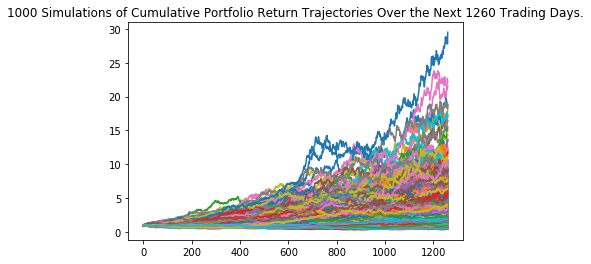

In [113]:
# Plot simulation outcomes
aapl_fiveyr_line_plot = MC_aapl_five_year.plot_simulation()

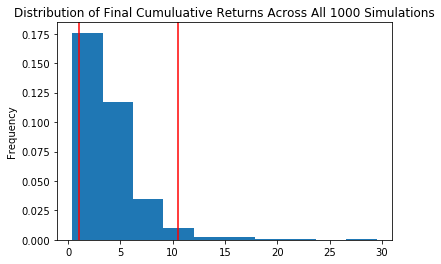

In [114]:
# Plot probability distribution and confidence intervals
aapl_fiveyr_dist_plot = MC_aapl_five_year.plot_distribution()

In [115]:
# Fetch summary statistics from the Monte Carlo simulation results
aapl_fiveyr_tbl = MC_aapl_five_year.summarize_cumulative_return()

# Print summary statistics
print(aapl_fiveyr_tbl)

count           1000.000000
mean               3.967573
std                2.814548
min                0.390910
25%                2.181235
50%                3.256799
75%                4.882427
max               29.496111
95% CI Lower       1.006458
95% CI Upper      10.526122
Name: 1260, dtype: float64


In [116]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_aaplfive = round(aapl_fiveyr_tbl[8],2)
ci_mean_aaplfive = round(aapl_fiveyr_tbl[1],2)
ci_upper_aaplfive = round(aapl_fiveyr_tbl[9],2)

print(ci_lower_aaplfive, ci_mean_aaplfive, ci_upper_aaplfive)

1.01 3.97 10.53


In [117]:
# Configuring a Monte Carlo simulation to forecast 1 year cumulative returns
MC_tsla_one_year = MCSimulation(
    portfolio_data = aapltsla_close,
    weights = [0, 1],
    num_simulation = 1000,
    num_trading_days = 252 * 1
)

In [118]:
# Printing the simulation input data
MC_tsla_one_year.portfolio_data.head()

AAPL                                              \
            Adj Close      Close       High        Low       Open   
2011-07-11  10.871630  12.642857  12.848929  12.600714  12.726429   
2011-07-12  10.863953  12.633929  12.774286  12.450714  12.626071   
2011-07-13  10.995090  12.786429  12.857143  12.727857  12.797500   
2011-07-14  10.987410  12.777500  12.914643  12.726429  12.893214   
2011-07-15  11.206989  13.032857  13.035714  12.827500  12.898929   

                                          TSLA                             \
                 Volume daily_return Adj Close  Close   High   Low   Open   
2011-07-11  442674400.0          NaN     5.670  5.670  5.706  5.60  5.680   
2011-07-12  451609200.0    -0.000706     5.634  5.634  5.818  5.60  5.674   
2011-07-13  391638800.0     0.012071     5.728  5.728  5.806  5.58  5.686   
2011-07-14  430533600.0    -0.000698     5.522  5.522  5.792  5.45  5.706   
2011-07-15  484467200.0     0.019985     5.516  5.516  5.566  5.48  5.558   

                                    
               Volume daily_return  
2011-07-11  4879000.0          NaN  
2011-07-12  5227000.0    -0.006349  
2011-07-13  5330000.0     0.016684  
2011-07-14  5795000.0    -0.035964  
2011-07-15  3545000.0    -0.001087

In [119]:
# Running a Monte Carlo simulation to forecast 1 year cumulative returns
MC_tsla_one_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.985126,1.036611,0.977277,1.025382,1.019710,1.007115,1.022506,1.015015,1.026650,0.991927,...,1.021553,1.041090,1.007260,1.010297,0.980491,0.958313,0.950569,1.016344,0.937481,0.993270
2,1.027770,1.035526,1.009429,1.003967,1.077909,1.013099,1.063500,1.024354,0.995223,0.955034,...,0.975429,1.087838,0.998802,0.987466,0.953238,0.991098,1.017112,0.976421,0.894769,1.062750
3,1.085031,1.049831,1.041019,1.063973,1.061848,1.064810,1.039996,1.034045,1.030893,0.939294,...,1.046452,1.119774,0.982297,0.980886,0.872279,0.991117,0.934129,0.965293,0.903502,1.145762
4,1.069783,1.064969,1.021131,1.145195,1.016197,1.055307,0.987296,1.042582,0.985732,0.947091,...,1.036525,1.139061,0.990765,1.013432,0.832280,1.000568,0.952248,0.970192,0.918953,1.170476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.702824,0.630480,2.630315,1.320102,1.354684,1.448763,0.693402,0.664719,3.347280,3.707773,...,2.622156,1.690204,1.778485,3.557193,0.861426,1.932463,1.379617,1.020340,2.973368,0.982592
249,1.668226,0.614451,2.655831,1.305009,1.359466,1.530174,0.694144,0.683207,3.276472,3.728970,...,2.686472,1.677289,1.889114,3.510569,0.864896,2.025356,1.316665,0.929366,3.000913,1.030378
250,1.733289,0.654157,2.656223,1.298785,1.326306,1.578776,0.711402,0.713908,3.424635,3.723367,...,2.712583,1.711562,1.866744,3.625089,0.877092,2.022914,1.353211,0.922605,2.981056,1.056823
251,1.729847,0.694588,2.577090,1.263831,1.298308,1.505162,0.696845,0.738865,3.401711,3.870224,...,2.579859,1.651185,1.928867,3.568336,0.850998,1.993233,1.292920,0.940920,2.827028,1.079353


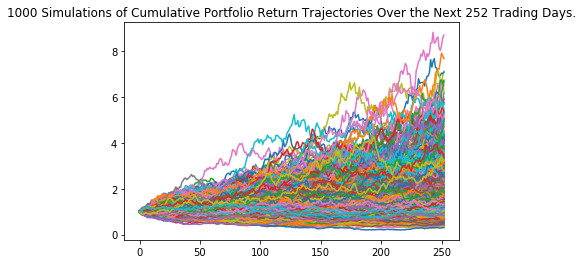

In [120]:
# Plot simulation outcomes
tsla_oneyr_line_plot = MC_tsla_one_year.plot_simulation()

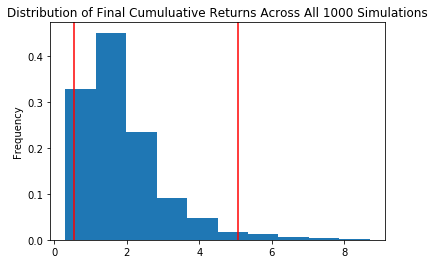

In [121]:
# Plot probability distribution and confidence intervals
tsla_oneyr_dist_plot = MC_tsla_one_year.plot_distribution()

In [122]:
# Fetch summary statistics from the Monte Carlo simulation results
tsla_oneyr_tbl = MC_tsla_one_year.summarize_cumulative_return()

# Print summary statistics
print(tsla_oneyr_tbl)

count           1000.000000
mean               1.871610
std                1.135193
min                0.304540
25%                1.091335
50%                1.586827
75%                2.307679
max                8.706669
95% CI Lower       0.552001
95% CI Upper       5.063619
Name: 252, dtype: float64


In [123]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_tslaone = round(tsla_oneyr_tbl[8],2)
ci_mean_tslaone = round(tsla_oneyr_tbl[1],2)
ci_upper_tslaone = round(tsla_oneyr_tbl[9],2)

print(ci_lower_tslaone, ci_mean_tslaone, ci_upper_tslaone)

0.55 1.87 5.06


In [124]:
# Configuring a Monte Carlo simulation to forecast 5 years cumulative returns
MC_tsla_five_year = MCSimulation(
    portfolio_data = aapltsla_close,
    weights = [0, 1],
    num_simulation = 1000,
    num_trading_days = 252 * 5
)

In [125]:
# Printing the simulation input data
MC_tsla_five_year.portfolio_data.head()

AAPL                                              \
            Adj Close      Close       High        Low       Open   
2011-07-11  10.871630  12.642857  12.848929  12.600714  12.726429   
2011-07-12  10.863953  12.633929  12.774286  12.450714  12.626071   
2011-07-13  10.995090  12.786429  12.857143  12.727857  12.797500   
2011-07-14  10.987410  12.777500  12.914643  12.726429  12.893214   
2011-07-15  11.206989  13.032857  13.035714  12.827500  12.898929   

                                          TSLA                             \
                 Volume daily_return Adj Close  Close   High   Low   Open   
2011-07-11  442674400.0          NaN     5.670  5.670  5.706  5.60  5.680   
2011-07-12  451609200.0    -0.000706     5.634  5.634  5.818  5.60  5.674   
2011-07-13  391638800.0     0.012071     5.728  5.728  5.806  5.58  5.686   
2011-07-14  430533600.0    -0.000698     5.522  5.522  5.792  5.45  5.706   
2011-07-15  484467200.0     0.019985     5.516  5.516  5.566  5.48  5.558   

                                    
               Volume daily_return  
2011-07-11  4879000.0          NaN  
2011-07-12  5227000.0    -0.006349  
2011-07-13  5330000.0     0.016684  
2011-07-14  5795000.0    -0.035964  
2011-07-15  3545000.0    -0.001087

In [126]:
# Running a Monte Carlo simulation to forecast 5 year cumulative returns
MC_tsla_five_year.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.000208,1.008134,1.031533,0.970026,1.029920,0.991466,1.025763,1.027372,1.025967,1.025760,...,1.033982,0.988478,0.998739,1.022456,0.956569,1.008108,0.989571,0.973791,1.017410,1.009516
2,1.045305,0.994937,1.012913,0.946110,0.984824,1.004166,1.036423,1.058305,1.023668,1.018108,...,1.077643,0.899458,0.929890,1.030281,0.921333,1.112597,0.945928,0.994620,1.060736,1.051109
3,1.093986,0.973986,1.034321,0.917887,0.977436,1.009108,1.028066,1.071600,0.989507,1.029644,...,1.075442,0.907857,0.950984,1.046778,0.884555,1.122166,0.973775,0.964662,1.010076,1.078831
4,1.078701,0.969446,0.955103,0.937961,0.983135,0.996917,1.046642,1.095675,1.015664,1.053248,...,1.038783,0.906086,0.950696,1.083286,0.887986,1.154163,0.942276,0.958967,1.025879,1.017507
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,8.346914,2.906091,1.869587,19.965324,12.577318,8.067695,6.744311,48.867581,0.930828,15.030079,...,10.110345,4.356949,7.604617,8.489648,8.250478,25.060398,2.804561,52.827422,4.569119,16.426311
1257,8.093522,2.813088,1.865186,20.117633,12.452191,7.589143,6.723069,48.923478,0.974200,15.353589,...,10.392811,4.389171,7.612464,8.309184,7.722980,24.039478,2.810824,50.353271,4.558769,16.381875
1258,7.649789,2.832704,1.955329,18.841426,12.449683,7.325588,6.482016,50.243468,1.040818,14.805196,...,10.956757,4.417696,7.598335,8.233456,7.889432,23.889331,2.816353,51.367673,4.355492,16.648928
1259,7.654891,2.626778,1.898579,18.976967,12.353105,7.319144,7.098373,50.185174,1.081388,15.115365,...,10.673682,4.563818,7.364252,8.606149,8.342384,23.754926,2.795085,52.473726,4.253974,17.097248


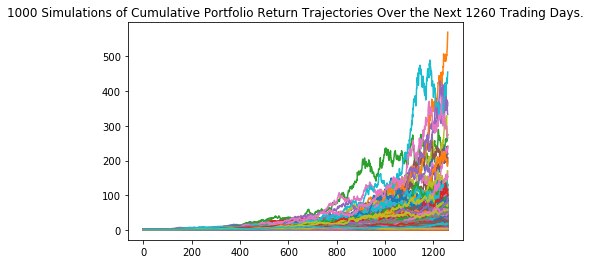

In [127]:
# Plot simulation outcomes
tsla_fiveyr_line_plot = MC_tsla_five_year.plot_simulation()

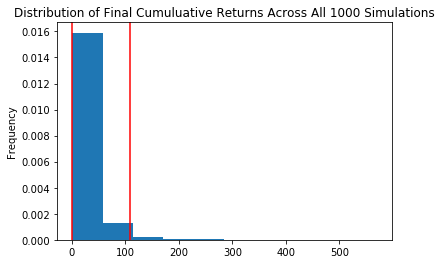

In [128]:
# Plot probability distribution and confidence intervals
tsla_fiveyr_dist_plot = MC_tsla_five_year.plot_distribution()

In [129]:
# Fetch summary statistics from the Monte Carlo simulation results
tsla_fiveyr_tbl = MC_tsla_five_year.summarize_cumulative_return()

# Print summary statistics
print(tsla_fiveyr_tbl)

count           1000.000000
mean              22.721869
std               41.059735
min                0.274051
25%                4.344543
50%               10.711715
75%               23.310624
max              569.468311
95% CI Lower       0.828063
95% CI Upper     108.027162
Name: 1260, dtype: float64


In [130]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes
ci_lower_tslafive = round(tsla_fiveyr_tbl[8],2)
ci_mean_tslafive = round(tsla_fiveyr_tbl[1],2)
ci_upper_tslafive = round(tsla_fiveyr_tbl[9],2)

print(ci_lower_tslafive, ci_mean_tslafive, ci_upper_tslafive)

0.83 22.72 108.03


In [135]:
# Define Panel visualization functions

#Stock Portfolio Weighting and Allocation Pie Chart
def stockportpie():
    """
    Create a lineplot based in the data argument.
    """
    
    fig = stockportsorted.plot(kind='pie', y='Position %', shadow = True, startangle=90, figsize=(15,10), autopct='%1.1f%%', title='Stock Position %', colormap='summer')
    plt.close(fig)
    
    return pn.pane.Matplotlib(fig, tight=True)

# def create_pie_chart():
#     """
#     Create a pie chart based in the data argument.
#     """
    
#     fig = plt.figure(figsize=(8, 4))
#     pie_chart = data.plot(color=color)
#     pie_chart.set_xlabel(xlabel, fontsize=12)
#     pie_chart.set_ylabel(ylabel, fontsize=12)
#     pie_chart.set_title(title, fontsize=14, fontweight="bold")    
#     plt.close(fig)
    
#     return pn.pane.Matplotlib(fig, tight=True)

#Crypto Portfolio Weighting and Allocation Pie Chart
def cryptoportpie():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = cryptoportsorted.plot(kind='pie', y='Position %', shadow = True, startangle=90, figsize=(15,10), autopct='%1.1f%%', title='Stock Position %', colormap='summer')
    
    return ax.figure

#Total Portfolio Weighting and Allocation Pie Chart
def totalportpie():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = totalportsorted.plot(kind='pie', y='Position %', shadow = True, startangle=90, figsize=(15,10), autopct='%1.1f%%', title='Stock Position %', colormap='summer')
    
    return ax.figure

#1-Year Stock Portfolio Simulation
def stock_oneyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_stock_one_year.plot_simulation()
    
    return ax.figure

#1-Year Stock Portfolio Simulation Distribution
def stock_oneyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_stock_one_year.plot_distribution()
    
    return ax.figure

#5-Year Stock Portfolio Simulation
def stock_fiveyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_stock_five_year.plot_simulation()

    
    return ax.figure

#5-Year Stock Portfolio Simulation Distribution
def stock_fiveyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_stock_five_year.plot_distribution()
    
    return ax.figure

#1-Year Crypto Portfolio Simulation
def crypto_oneyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_crypto_one_year.plot_simulation()
    
    return ax.figure

#1-Year Crypto Portfolio Simulation Distribution
def crypto_oneyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_crypto_one_year.plot_distribution()
    
    return ax.figure

#5-Year Crypto Portfolio Simulation
def crypto_fiveyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_crypto_five_year.plot_simulation()

    
    return ax.figure

#5-Year Crypto Portfolio Simulation Distribution
def crypto_fiveyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_crypto_five_year.plot_distribution()
    
    return ax.figure

#1-Year 60/40 Stocks and Bonds Portfolio Simulation
def spagg_oneyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_spagg_one_year.plot_simulation()
    
    return ax.figure

#1-Year 60/40 Stocks and Bonds Portfolio Simulation Distribution
def spagg_oneyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_spagg_one_year.plot_distribution()
    
    return ax.figure

#5-Year 60/40 Stocks and Bonds Portfolio Simulation
def spagg_fiveyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_spagg_five_year.plot_simulation()

    
    return ax.figure

#5-Year 60/40 Stocks and Bonds Portfolio Simulation Distribution
def spagg_fiveyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_spagg_five_year.plot_distribution()
    
    return ax.figure

#1-Year SPY Simulation
def spy_oneyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_spy_one_year.plot_simulation()
    
    return ax.figure

#1-Year SPY Simulation Distribution
def spy_oneyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_spy_one_year.plot_distribution()
    
    return ax.figure

#5-Year SPY Simulation
def spy_fiveyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_spy_five_year.plot_simulation()

    
    return ax.figure

#5-Year SPY Distribution
def spy_fiveyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_spy_five_year.plot_distribution()
    
    return ax.figure

#1-Year QQQ Simulation
def qqq_oneyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_qqq_one_year.plot_simulation()
    
    return ax.figure

#1-Year QQQ Simulation Distribution
def qqq_oneyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_qqq_one_year.plot_distribution()
    
    return ax.figure

#5-Year QQQ Simulation
def qqq_fiveyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_qqq_five_year.plot_simulation()

    
    return ax.figure

#5-Year QQQ Distribution
def qqq_fiveyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_qqq_five_year.plot_distribution()
    
    return ax.figure

#1-Year Russell Simulation
def rut_oneyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_rut_one_year.plot_simulation()
    
    return ax.figure

#1-Year Russell Simulation Distribution
def rut_oneyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_rut_one_year.plot_distribution()
    
    return ax.figure

#5-Year Russell Simulation
def rut_fiveyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_rut_five_year.plot_simulation()

    
    return ax.figure

#5-Year Russell Distribution
def rut_fiveyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_rut_five_year.plot_distribution()
    
    return ax.figure

#1-Year Apple Simulation
def aapl_oneyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_aapl_one_year.plot_simulation()
    
    return ax.figure

#1-Year Apple Simulation Distribution
def aapl_oneyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_aapl_one_year.plot_distribution()
    
    return ax.figure

#5-Year Apple Simulation
def aapl_fiveyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_aapl_five_year.plot_simulation()

    
    return ax.figure

#5-Year Apple Distribution
def aapl_fiveyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_aapl_five_year.plot_distribution()
    
    return ax.figure

#1-Year Tesla Simulation
def tsla_oneyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_tsla_one_year.plot_simulation()
    
    return ax.figure

#1-Year Tesla Simulation Distribution
def tsla_oneyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_tsla_one_year.plot_distribution()
    
    return ax.figure

#5-Year Tesla Simulation
def tsla_fiveyr_line_plot():
    """
    Create a lineplot based in the data argument.
    """
    
    ax = MC_tsla_five_year.plot_simulation()

    
    return ax.figure

#5-Year Tesla Distribution
def tsla_fiveyr_dist_plot():
    """
    Create a barplot based in the data argument.
    """
    
    ax = MC_tsla_five_year.plot_distribution()
    
    return ax.figure


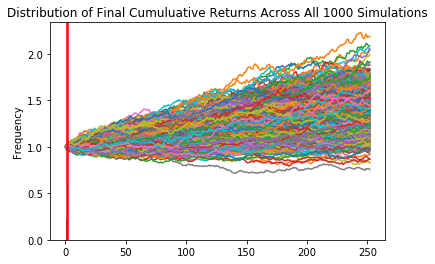

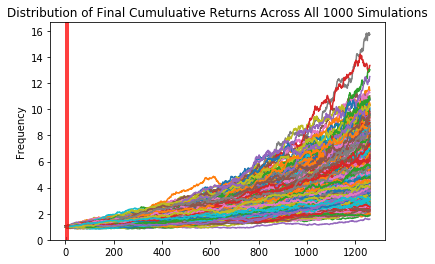

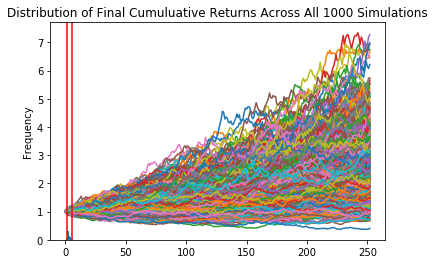

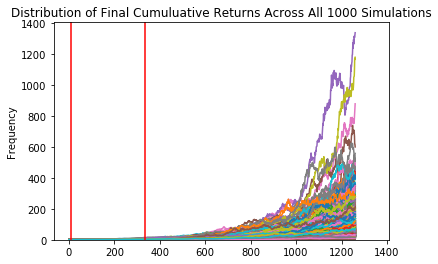

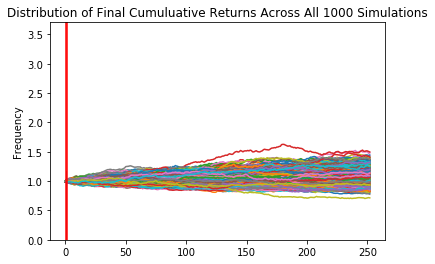

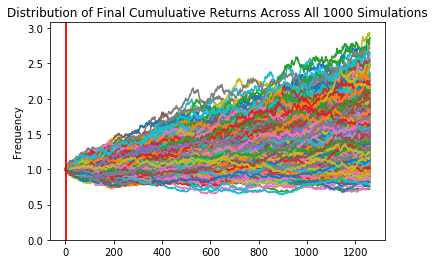

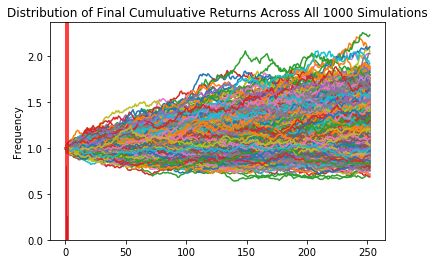

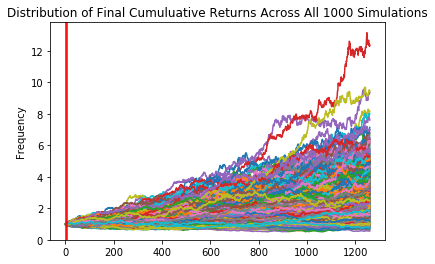

In [136]:
##Dashboard Setup
# Create a Title for the Dashboard
title = pn.pane.Markdown(
    """
# Investment Portfolio Analysis, Simulations and Forecasting
""",
    width=800,
)

# Define a welcome text
welcome = pn.pane.Markdown(
    """
# Project 1: Portfolio Analysis, Simulations and Benchmark Comparison Dashboard
## Motivation and Summary
### Spreadsheets are getting outdated and overrated with the addition of more efficient methods of analyzing data. Updating a spreadsheet with data even prior to performing analysis can take hours. However, in this bootcamp we have learned methods to more efficiently retrieve and analyze data using Python and Jupyter Lab. The purpose of this project is to develop a notebook that uses the power of portfolio and risk analysis spreadsheets into one servable dashboard that can be viewed by the user/client. 
### Question: 
#### 1. How do I create a dashboard for my stock and crypto portfolio? We asked this question because we learned in our bootcamp classes how to build a dashboard for real estate analysis and mapping data. In this assignment we saw the power of creating a dashboard and providing deliverable and servable information to clients and users.
#### 2. How does the inputted portfolio compare to a traditional 60/40 Stocks and Bonds Strategy and other benchmark indexes? We asked this question to provide information to the client/user on the most important aspect of portfolio management being risk analysis. We wanted the use of simulations and forecasted returns to show the risk structure of the portfolio compared to the market benchmarks. 
#### 3. What is the forecasted return? We asked this question to provide the actual numeric forecasted returns in dollar amount based on 1-year and 5-year projections. We wanted to provide the exact value of the expected return for the inputted portfolio. 
### In summary, we were successful in meeting our goals for the requirements of the project and included possible further work in the Postmortem below. We found that our selection of stocks being more growth oriented had shown a high-risk structure with a high beta compared to the benchmark indexes. As we suspected and as a result of the recent strength of growth stocks and assets, the portfolio has a much higher expected return compared to benchmarks. The volatility and growth potential of having a small percentage of the portfolio in crypto assets can also return larger than expected returns even when using low probability simulations. 
## Questions & Data
### Answer: 
#### 1. We used the Panel library to create a dashboard for our investment portfolio with tabs showing the deliverable and servable information for the client/user. The tabs include a Welcome description including this read.me file, the inputted portfolio, percentage allocations, expected returns and benchmark simulations and expected returns. The information is presented in the form of graphical plots and calculation statements based on data calculated in the simulations. 
#### 2. We used Monte Carlo Simulations to forecast potential expected returns. The benchmark indexes include the S&P 500 and the Nasdaq. Simulations were conducted for the stock portfolio, crypto portfolio, a 60/40 Stocks and Bonds portfolio and the benchmark indexes for a 1-year and 5-year timeframe. The forecasted returns shown in each simulation plot provide data on the average expected returns within 95% confidenc eof simulated outcomes. The calculations for average returns, minimums and maximums paint a picture that shows the difference in the risk structure of the portfolio compared to the benchmarks. 
#### 3. The Yahoo Finance API provides a constant connection of market data to the notebook. Using the data from the API in CSV format we were able to create our own dataframes that construct the inputted portfolio for the client/user. This means that the notebook can be run on a constant frequency to provide data and forecasts over any desired timeframe. The recommended timeframe is either monthly, quarterly or bi-yearly for adjustments of position sizes and portfolio management. 

## Data Cleanup & Exploration
### Data collection was completed with the use of The Yahoo Finance API or more specifically the y.finance library. Stock market information as collected using this library for each asset of stocks and cryptos into CSV format and readable in the notebook as a dataframe. The dataframe for stock market information was indexed for each ticker and spanned as far as the information is available or to a maximum of 10 years.
### Stocks: (10)
#### 1. QQQ (NASDAQ)
#### 2. CIBC
#### 3. MSFT
#### 4. ASUS
#### 5. TSLA
#### 6. PFE
#### 7. NVDA
#### 8. F
#### 9. CCL
#### 10. AC
### Crypto: (5)
#### 1. Bitcoin
#### 2. Ethereum
#### 3. Cardano
#### 4. Chainlink
#### 5. Litecoin
### We found that running a simulation for the complete portfolio of stocks and crypto was a little bit misleading and did not provide the full information of the risk structure. We then chose to make more sense of the data in the simulations by running separate simulations for each of the stocks and the cryptos. After doing this we were able to see the true effect of having a small allocation to cryptos in the portfolio to increase expected returns. Another issue we focused on was the limited amount of market data for cryptos which resulted in less accurate simulations compared to the stock simulations. We worked around this by using the crypto tickers in USD currency as there was more time data for these tickers and gave more historical data to work with. 

## Data Analysis
### The simulated average return for the stock portfolio over a 5-year period was 5x the original investment. The simulated average return for the crypto portfolio over a 5-year period was 89x the original investment. The simulated average return for the 60/40 Stocks and Bonds portfolio over a 5-year period was 1.5x the original investment or a 50% increase. The simulated average return for the Nasdaq index over a 5-year period was 2.7x the original investment. The results compiled here show that simply investing money into the benchmark indexes yields a much larger expected return over a 5-year period compared to the traditional 60/40 Stock and Bonds portfolio. Furthermore, for the investors that are willing to put in more work into picking individual stocks and look to outperform the market indexes returns by using growth stocks similar to the ones chosen in this project. The simulation do not factor in dividends and dividend growth and a separate calculations for expected returns would need to be done to consider the full expected return. For the simulations done on the shorter 1-year timeframe, the short-term risk that is shown by the simulations with negative returns or using the minimum value. These simulations show that the choice of growth stock in the inputted portfolio can offer larger than expected returns in both the long-term and the short term. Furthermore, with more volatile stocks and cryptos also come with the risk of lower than expected or negative returns in the short-term depending on market conditions. 

## Discussion
## The resulting analysis proves that the 60/40 Stocks and Bonds strategy is the most conservative form of investing. For people with a larger investment window of greater than 5-years, investing in market indexes seems to be the more common strategy in modern days and yields a much larger expected return with minimal increase in risk. For the people who are willing to do more than plow their money into one or two market indexes or ETF's, building a diversified investment portfolio of stocks spread across the various market sectors and with a small allocation of <10% can yield larger than expected returns. The creation of your own portfolio is at the very least the acceptance of the challenge of beating and out-performing the stock market and other hedge funds.

## Postmortem 
### - Selector for user interaction to modify analysis information.
### - Include columns in the portfolio table for current market value and a portfolio position weighting using the ATR of each asset. 
### - Input function for tickers, share amount and share price. 
### - Add an additional column for sector and provide a pie chart for sector allocation which shows the diversification of assets.
""",
    width=1024,
)

# Create a tab layout for the dashboard
tabs = pn.Tabs(
    # First tab
    (
        "Welcome",
        pn.Column(
            welcome
        )
    ),
    # Second tab
    (
        "My Portfolio",
        pn.Column(
                pn.Row(totalportfoliotable, totalportsorted),
                pn.Row(stockportfoliotable, stockportsorted),
                pn.Row(cryptoportfoliotable, cryptoportsorted)
        )
    ),
    # Third tab
    (
        "Portfolio Monte Carlo Simulation and Forecasted Returns",
        pn.Column(
                pn.Row("##Stock Portfolio 1-year Simulation", stock_oneyr_line_plot(), stock_oneyr_dist_plot(), stock_oneyr_tbl),
                pn.Row("##Stock Portfolio 5-year Simulation", stock_fiveyr_line_plot(), stock_fiveyr_dist_plot(), stock_fiveyr_tbl),
                #f"The 1-year expected returns for the stock portfolio is {totalstockvalue * ci_mean_stockone} ",
                #",",
                pn.Row("##Crypto Portfolio 1-year Simulation", crypto_oneyr_line_plot(), crypto_oneyr_dist_plot(), crypto_oneyr_tbl),
                pn.Row("##Crypto Portfolio 5-year Simulation", crypto_fiveyr_line_plot(), crypto_fiveyr_dist_plot(), crypto_fiveyr_tbl),
                "",
                ""
        )
    ),
    # Forth Tab
    (
        "Benchmark Monte Carlo Simulations and Forecasted Returns",
        pn.Column(
                pn.Row("##60/40 Stocks and Bonds Portfolio 1-year Simulation", spagg_oneyr_line_plot(), spagg_oneyr_dist_plot(), spagg_oneyr_tbl),
                pn.Row("##60/40 Stocks and Bonds Portfolio 5-year Simulation", spagg_fiveyr_line_plot(), spagg_fiveyr_dist_plot(), spagg_fiveyr_tbl),
                "",
                pn.Row("##Nasdaq Benchmark 1-year Simulation", qqq_oneyr_line_plot(), qqq_oneyr_dist_plot(), qqq_oneyr_tbl),
                pn.Row("##Nasdaq Benchmark 5-year Simulation", qqq_fiveyr_line_plot(), qqq_fiveyr_dist_plot(), qqq_fiveyr_tbl),
                ""
        )
    )
)

# Create the main dashboard
dashboard = pn.Column(
    pn.Row(title),
    tabs,
    width = 1024,
    height = 768
)


Column(height=768, sizing_mode='fixed', width=1024)
    [0] Row
        [0] Markdown(str, width=800)
    [1] Tabs
        [0] Column
            [0] Markdown(str, width=1024)
        [1] Column
            [0] Row
                [0] DataFrame(DataFrame)
                [1] Str(AxesSubplot)
            [1] Row
                [0] DataFrame(DataFrame)
                [1] Str(AxesSubplot)
            [2] Row
                [0] DataFrame(DataFrame)
                [1] Str(AxesSubplot)
        [2] Column
            [0] Row
                [0] Markdown(str)
                [1] Matplotlib(Figure)
                [2] Matplotlib(Figure)
                [3] DataFrame(Series)
            [1] Row
                [0] Markdown(str)
                [1] Matplotlib(Figure)
                [2] Matplotlib(Figure)
                [3] DataFrame(Series)
            [2] Row
                [0] Markdown(str)
                [1] Matplotlib(Figure)
                [2] Matplotlib(Figure)
                [3] DataFrame(Series)
            [3] Row
                [0] Markdown(str)
                [1] Matplotlib(Figure)
                [2] Matplotlib(Figure)
                [3] DataFrame(Series)
            [4] Markdown(str)
            [5] Markdown(str)
        [3] Column
            [0] Row
                [0] Markdown(str)
                [1] Matplotlib(Figure)
                [2] Matplotlib(Figure)
                [3] DataFrame(Series)
            [1] Row
                [0] Markdown(str)
                [1] Matplotlib(Figure)
                [2] Matplotlib(Figure)
                [3] DataFrame(Series)
            [2] Markdown(str)
            [3] Row
                [0] Markdown(str)
                [1] Matplotlib(Figure)
                [2] Matplotlib(Figure)
                [3] DataFrame(Series)
            [4] Row
                [0] Markdown(str)
                [1] Matplotlib(Figure)
                [2] Matplotlib(Figure)
                [3] DataFrame(Series)
            [5] Markdown(str)
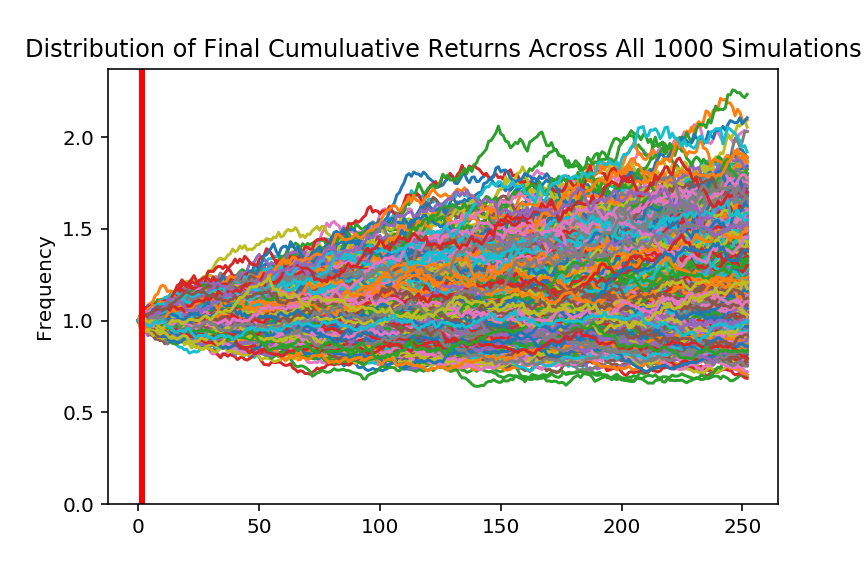
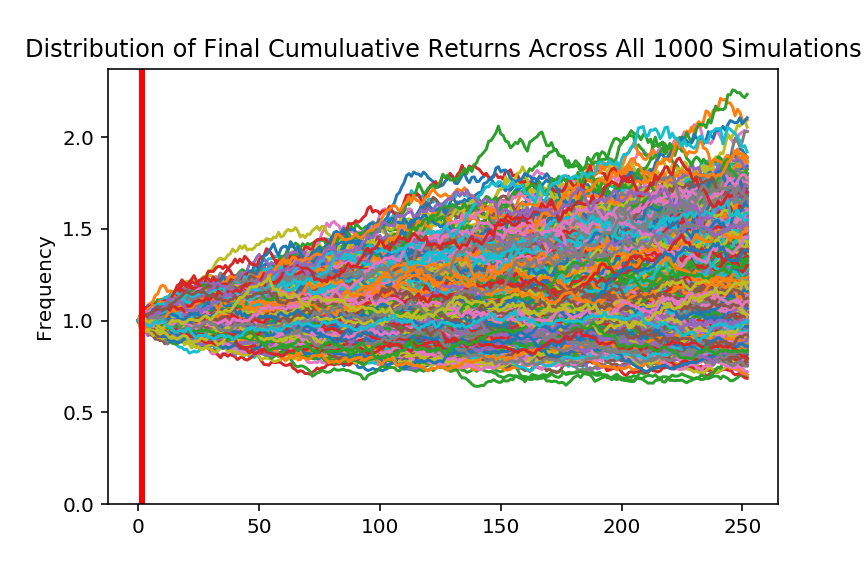
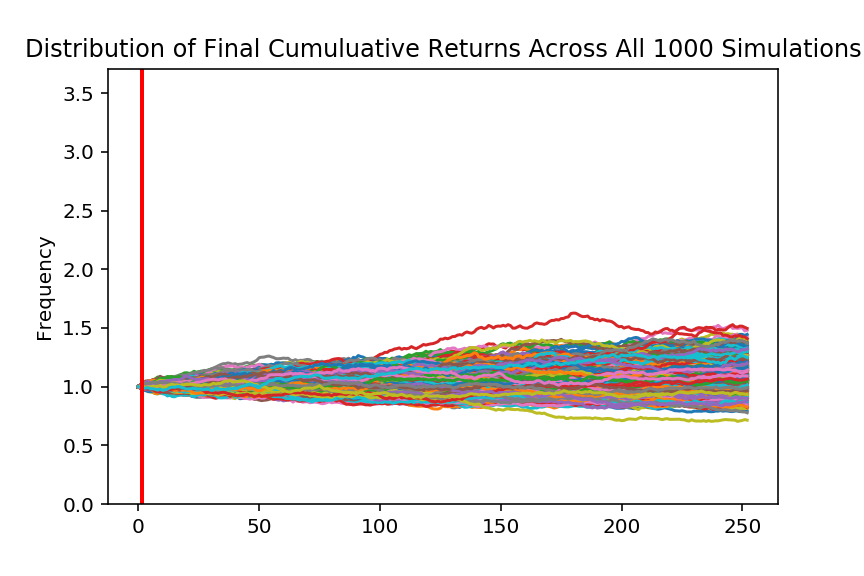
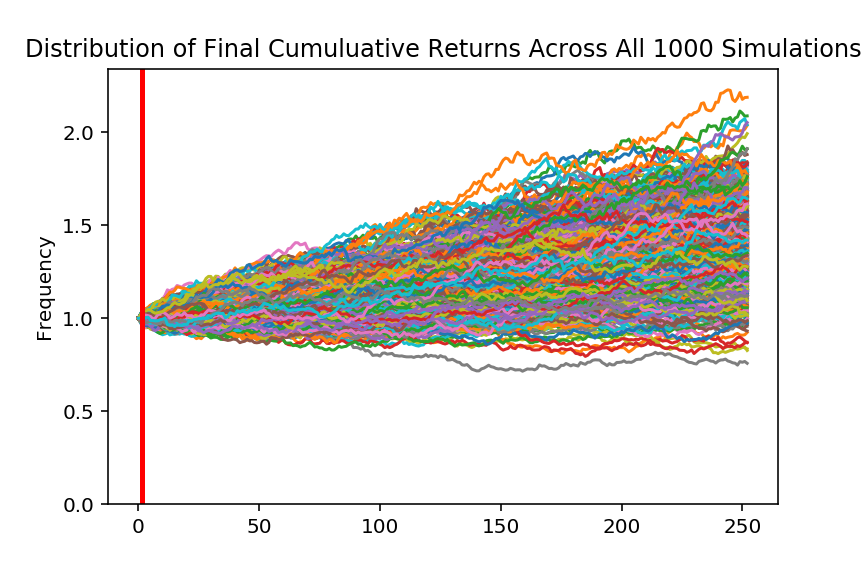
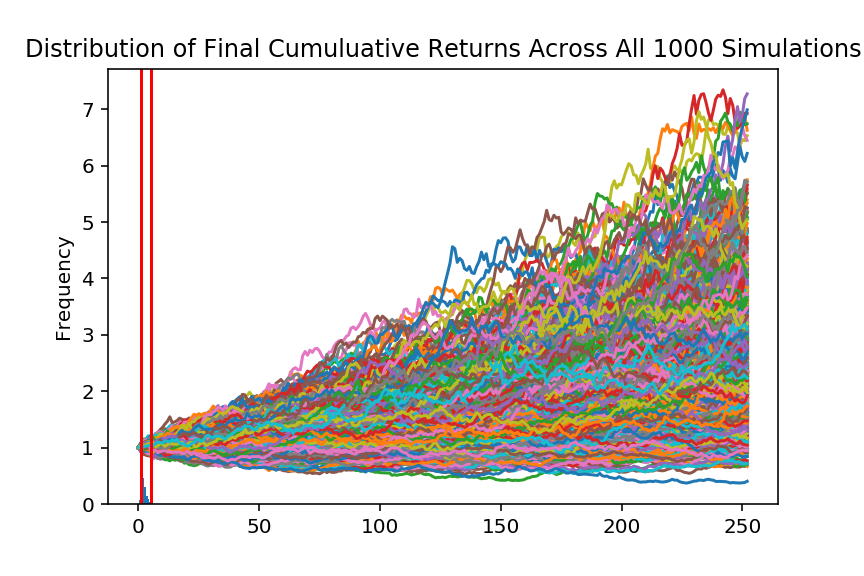
...
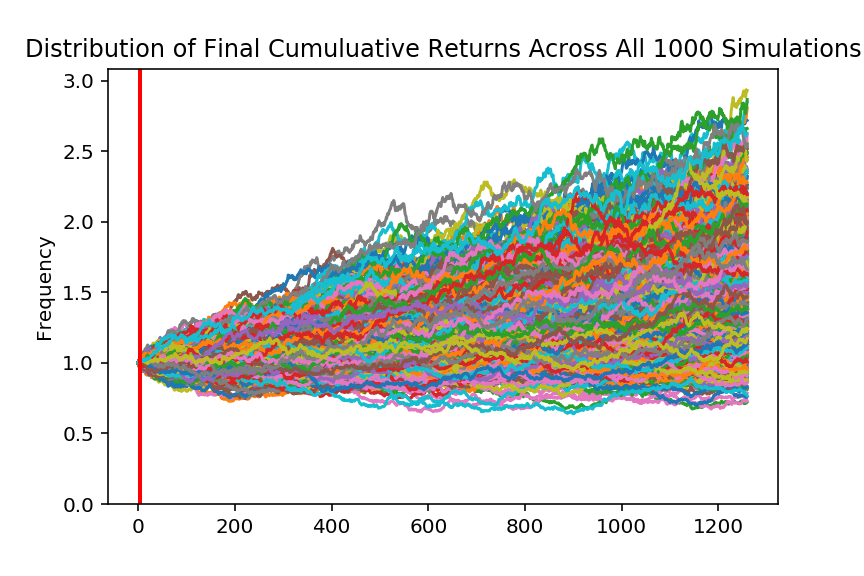
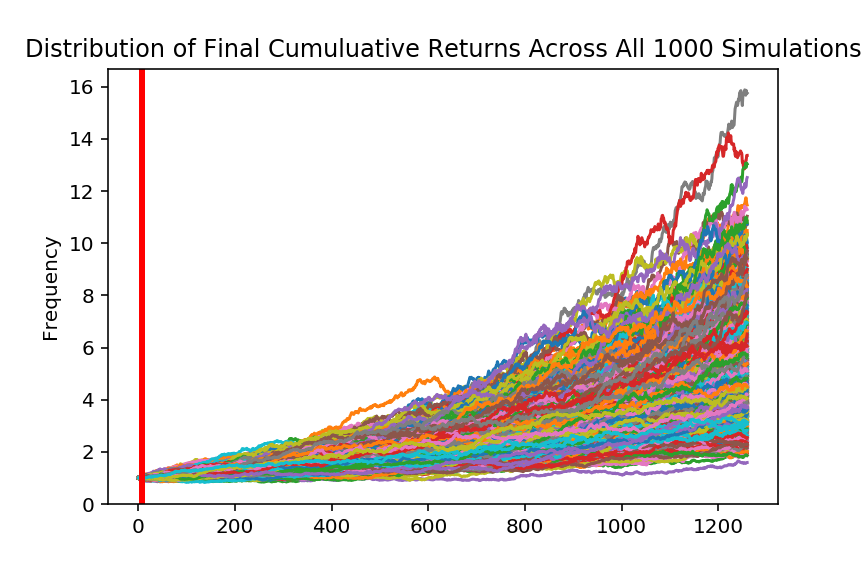
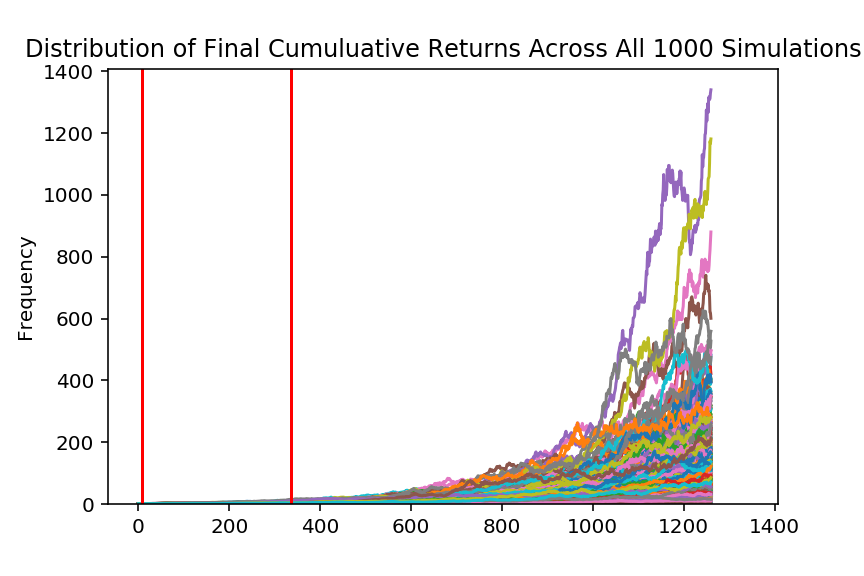
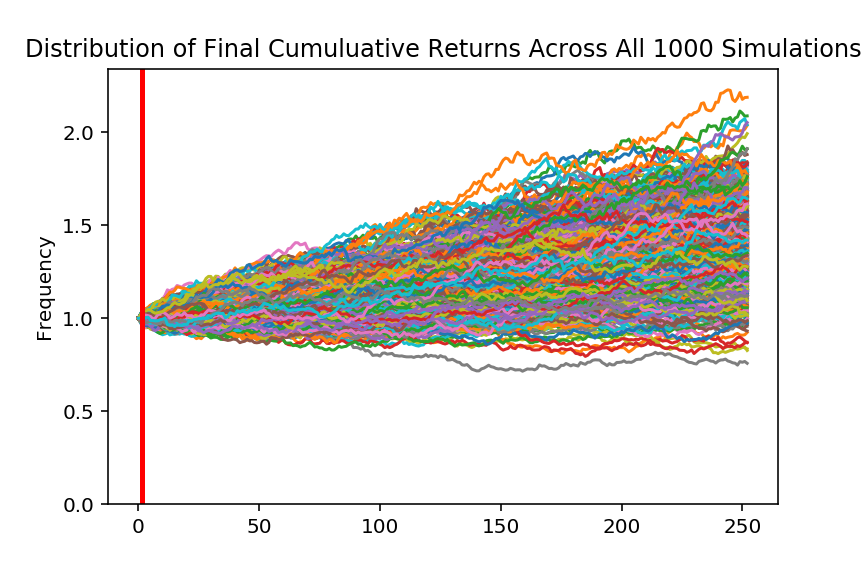
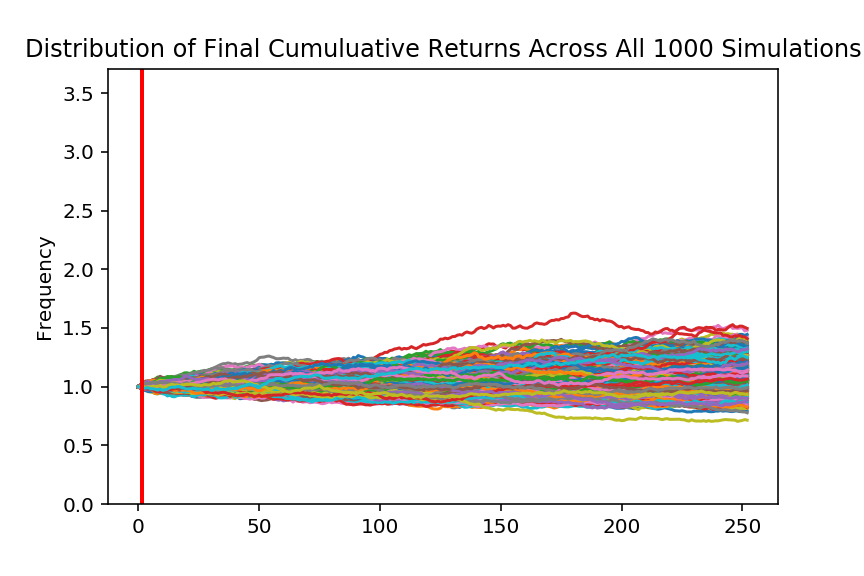

In [134]:
dashboard.servable()